# Binary Classification Model for Competition Data

This notebook will perform the following steps:
1. Load and preprocess the data from each dataset folder (`X_train.csv`, `y_train.csv`, `X_test.csv`).
2. Conduct feature engineering and visualize the data.
3. Train a neural network model for binary classification.
4. Evaluate model performance using accuracy, precision, and F1 score.
5. Save predictions to `y_predict.csv` for each dataset.

In [1]:
import warnings
warnings.filterwarnings("ignore")

import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, f1_score
from imblearn.over_sampling import SMOTE
from sklearn.feature_selection import SelectFromModel
from tensorflow.keras.callbacks import EarlyStopping

import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns



# Set the main directory path
main_dir = '../Competition_data'

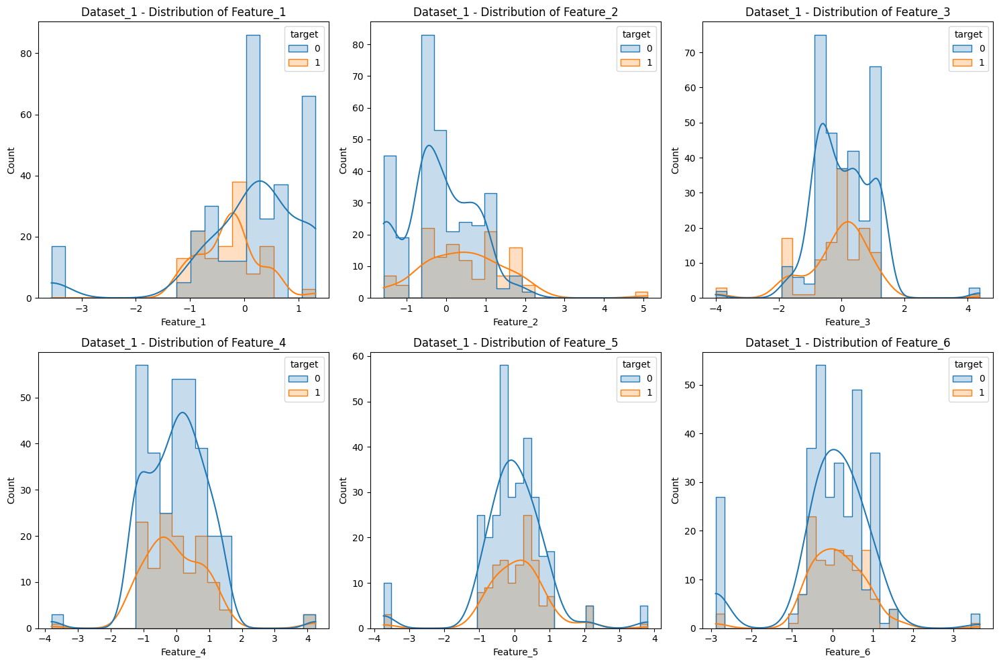

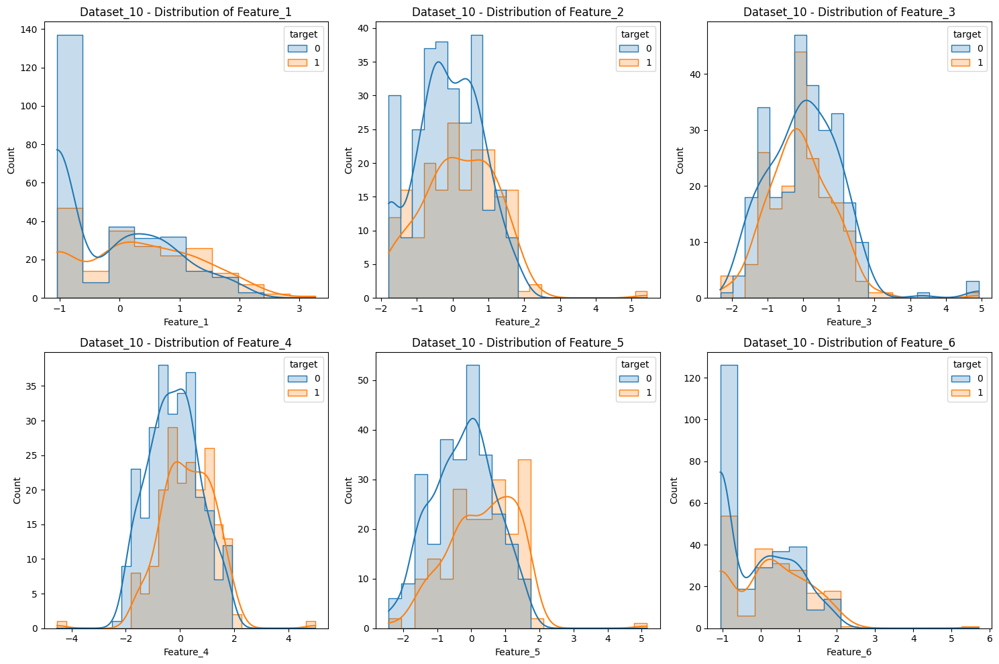

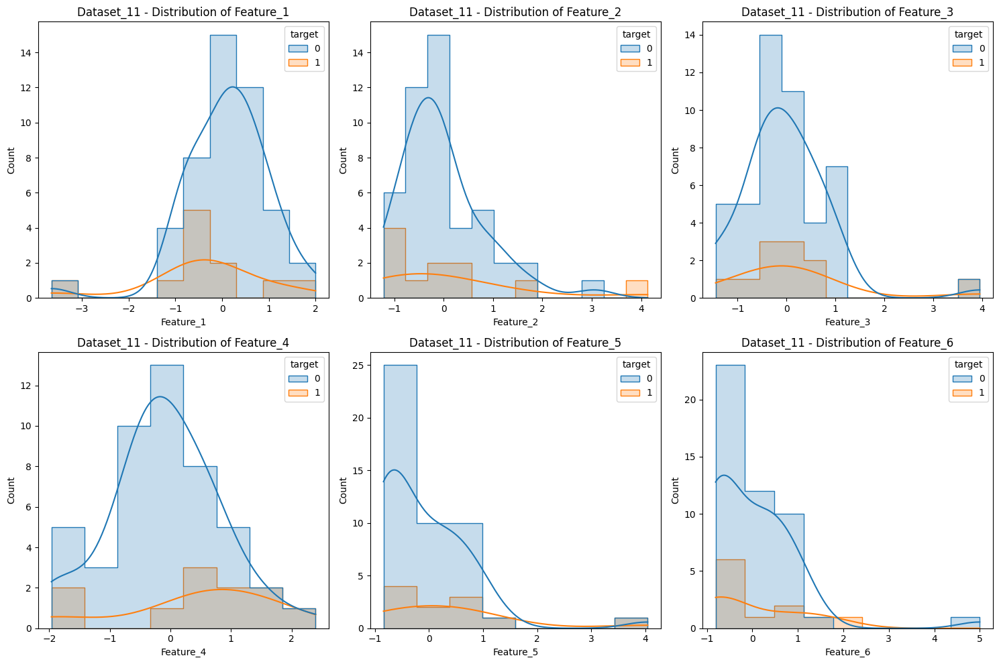

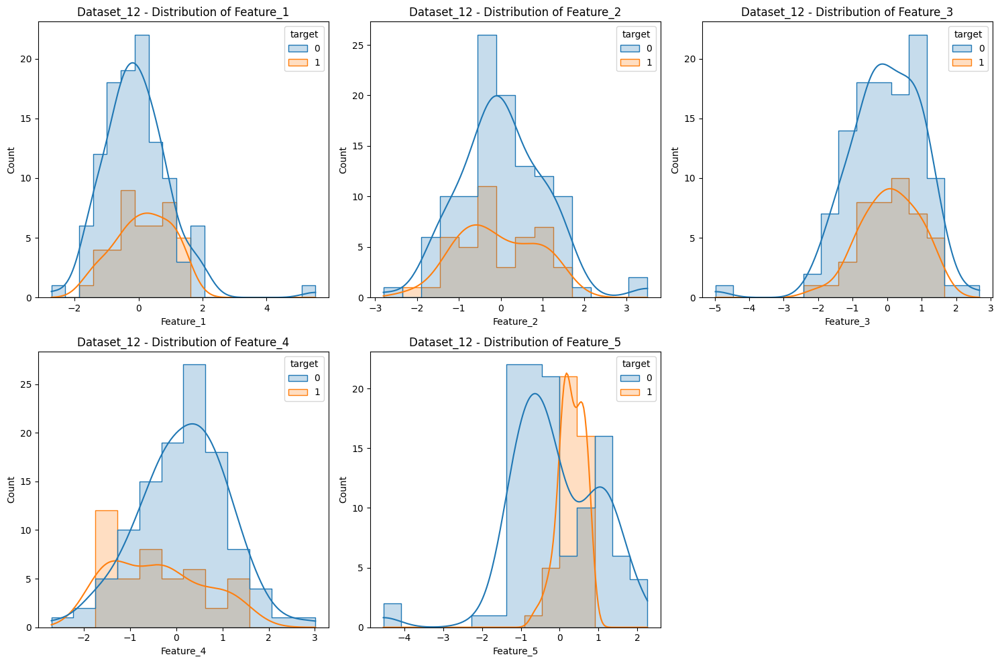

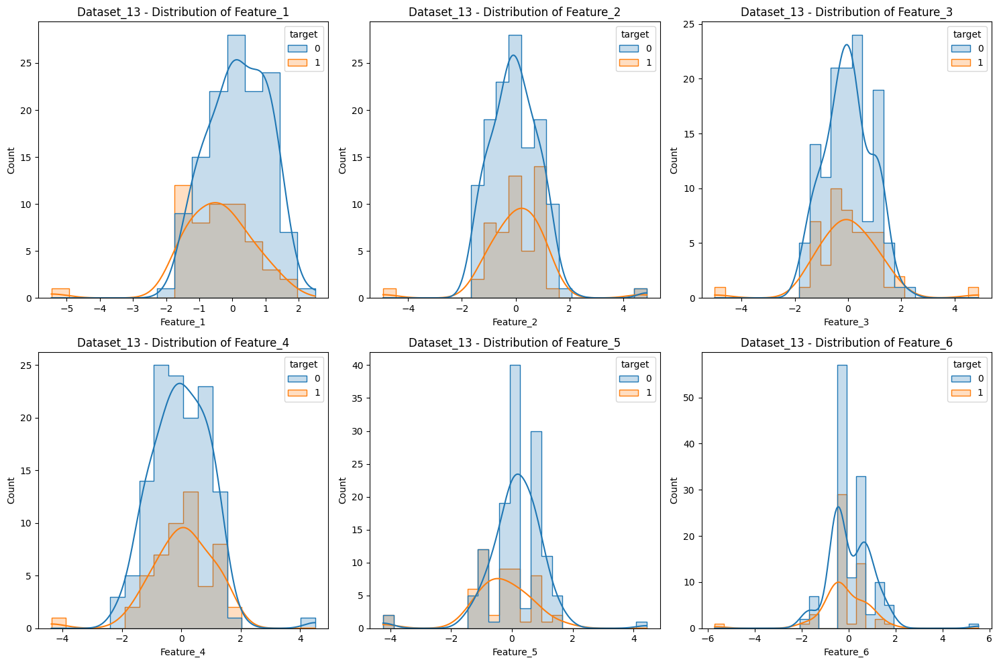

...

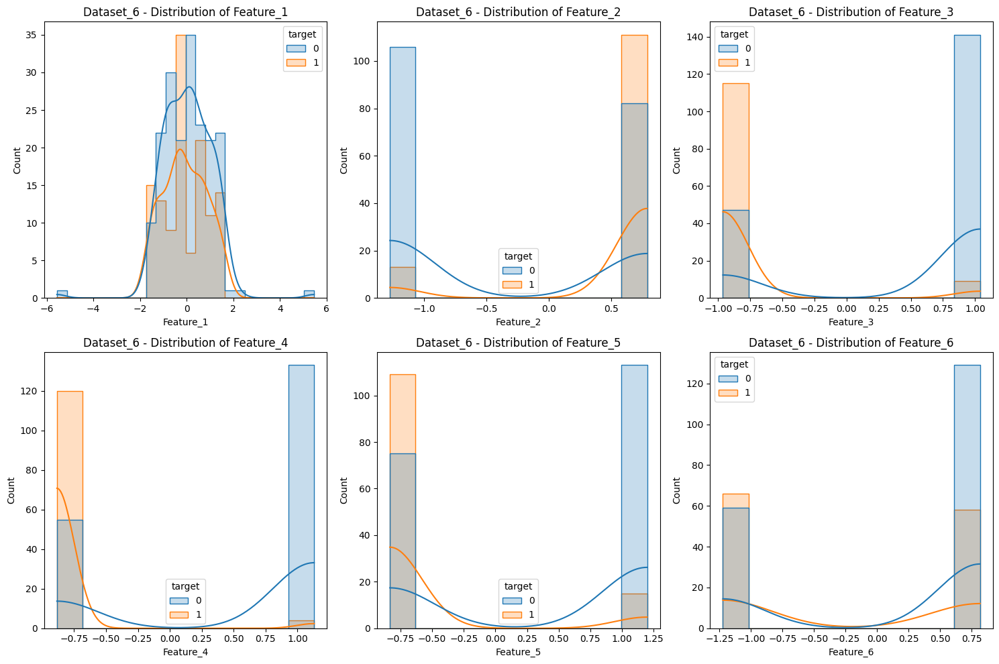

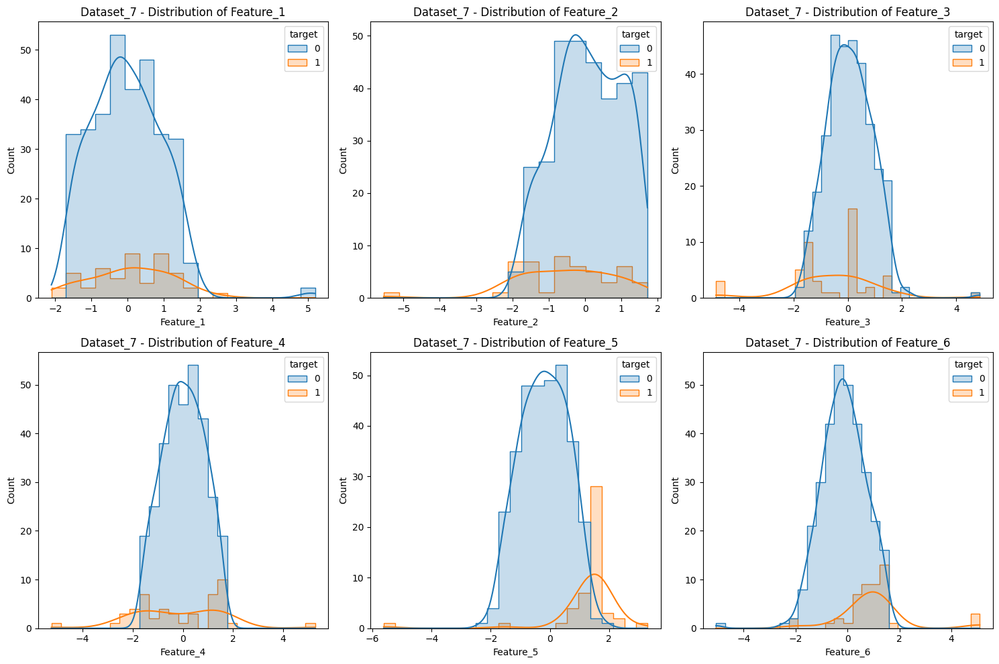

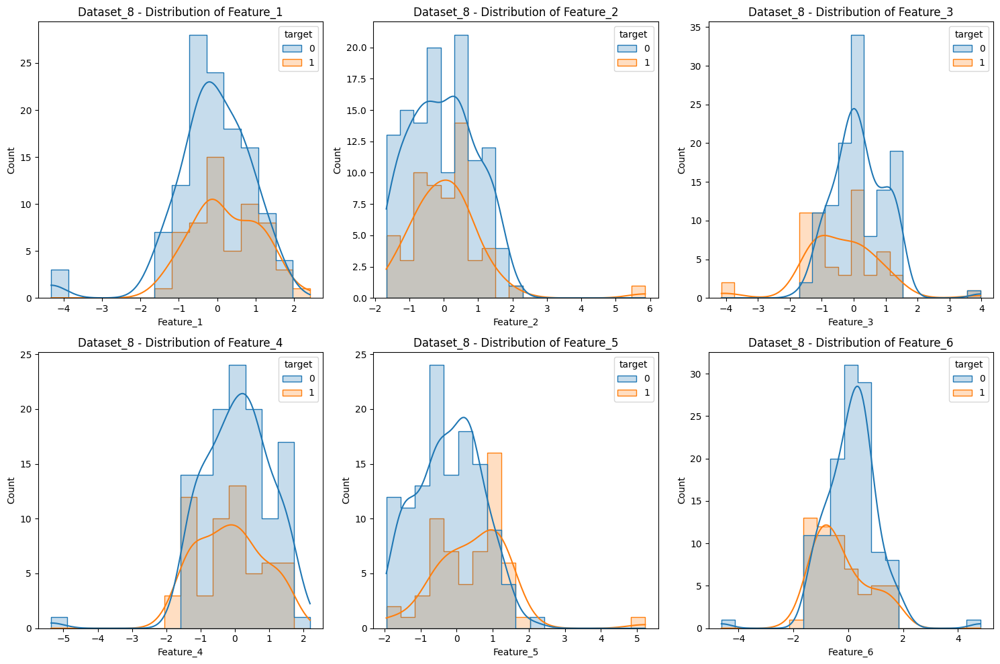

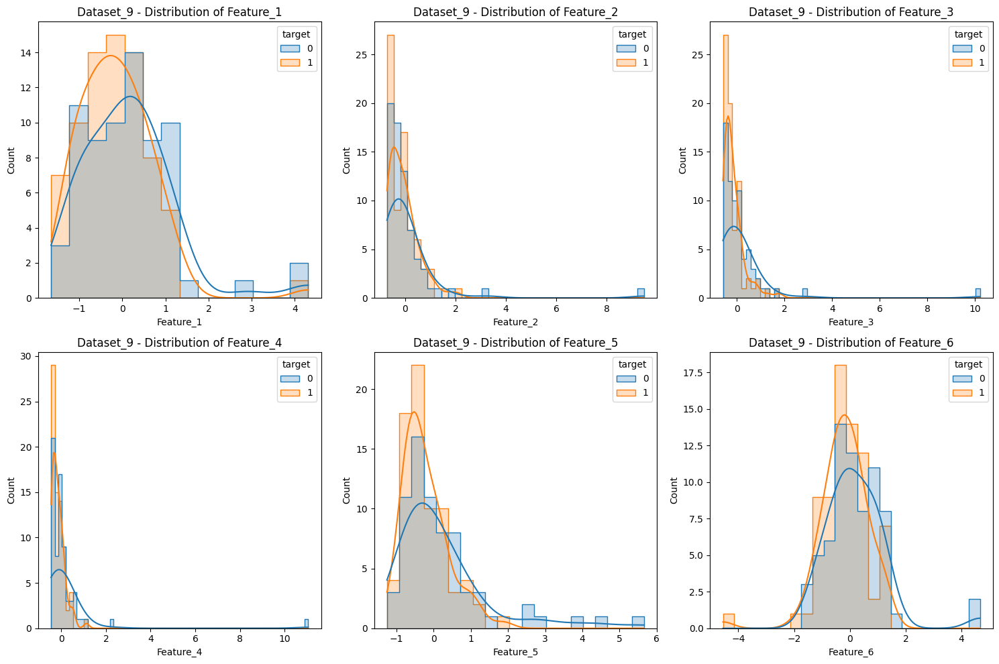

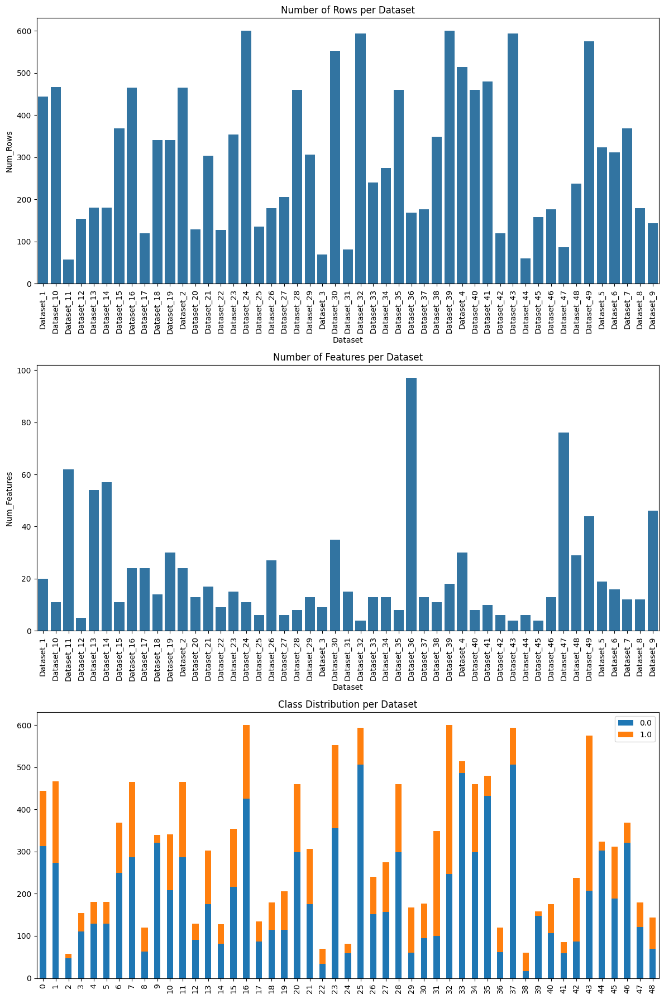

In [2]:

# Data Preprocessing: Scaling and visualization
def preprocess_and_visualize(X_train, y_train, title='Dataset'):
    # Scale features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    
    # Convert scaled data back to DataFrame for visualization
    X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
    X_train_scaled_df['target'] = y_train.values
    
    # Visualize distribution of features with respect to the target
    plt.figure(figsize=(15, 10))
    for i, feature in enumerate(X_train.columns[:6], 1):  # Limiting to the first 6 features for brevity
        plt.subplot(2, 3, i)
        sns.histplot(data=X_train_scaled_df, x=feature, hue='target', element="step", kde=True)
        plt.title(f'{title} - Distribution of {feature}')
    plt.tight_layout()
    plt.show()
    
    return X_train_scaled_df


# Collect dataset summary information
dataset_info = []
folders = sorted(os.listdir(main_dir))

for folder in folders:
    dataset_path = os.path.join(main_dir, folder)
    x_train_path = os.path.join(dataset_path, 'X_train.csv')
    y_train_path = os.path.join(dataset_path, 'y_train.csv')
    if os.path.exists(x_train_path) and os.path.exists(y_train_path):
        X_train = pd.read_csv(x_train_path)
        y_train = pd.read_csv(y_train_path)
        dataset_info.append({
            'Dataset': folder,
            'Num_Features': X_train.shape[1],
            'Num_Rows': X_train.shape[0],
            'Class_Distribution': y_train['target'].value_counts().to_dict()
        })

        # Run preprocessing and visualize for Dataset_34
        X_train_scaled = preprocess_and_visualize(X_train, y_train['target'], title=folder)


# Convert to DataFrame for visualization
dataset_info_df = pd.DataFrame(dataset_info)

# Plot the dataset summary
fig, axes = plt.subplots(3, 1, figsize=(12, 18))

# Plot number of rows in each dataset
sns.barplot(x='Dataset', y='Num_Rows', data=dataset_info_df, ax=axes[0])
axes[0].set_title('Number of Rows per Dataset')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90)

# Plot number of features in each dataset
sns.barplot(x='Dataset', y='Num_Features', data=dataset_info_df, ax=axes[1])
axes[1].set_title('Number of Features per Dataset')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=90)

# Plot class distribution per dataset
class_dist_df = dataset_info_df['Class_Distribution'].apply(pd.Series).fillna(0)
class_dist_df.plot(kind='bar', stacked=True, ax=axes[2])
axes[2].set_title('Class Distribution per Dataset')
axes[2].set_xticklabels(axes[2].get_xticklabels(), rotation=90)

plt.tight_layout()
plt.show()


Processing Dataset_1...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5339 - loss: 0.6893 - val_accuracy: 0.5794 - val_loss: 0.6637
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6572 - loss: 0.6504 - val_accuracy: 0.6667 - val_loss: 0.6442
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6509 - loss: 0.6400 - val_accuracy: 0.6587 - val_loss: 0.6282
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6767 - loss: 0.6280 - val_accuracy: 0.6587 - val_loss: 0.6127
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7188 - loss: 0.6039 - val_accuracy: 0.6984 - val_loss: 0.5984
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7093 - loss: 0.5876 - val_accuracy: 0.6905 - val_loss: 0.5876
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7144 - loss: 0.5909 - val_accuracy: 0.7143 - val_loss: 0.5775
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6935 - loss: 0.5883 - val_accuracy: 0.7222 - 

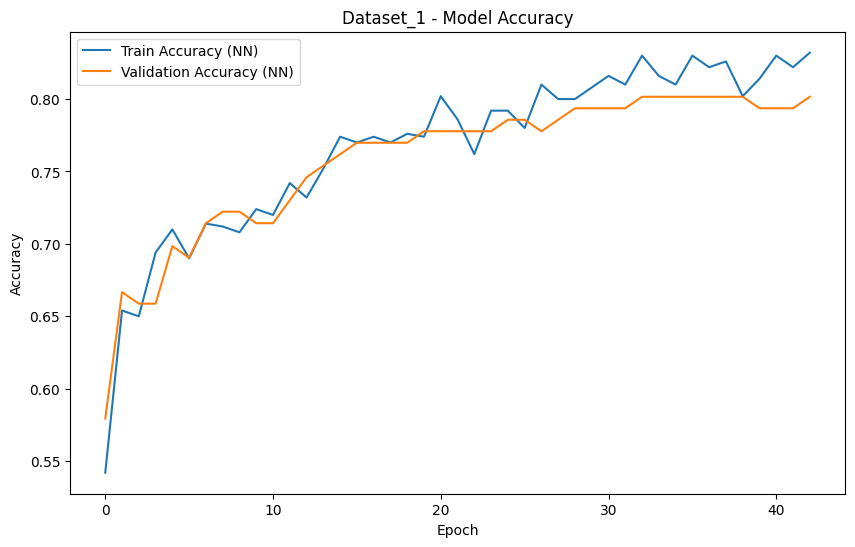

Processing Dataset_10...
Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5031 - loss: 0.7155 - val_accuracy: 0.5273 - val_loss: 0.6622
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5122 - loss: 0.6855 - val_accuracy: 0.7091 - val_loss: 0.6423
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5951 - loss: 0.6720 - val_accuracy: 0.7727 - val_loss: 0.6280
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6074 - loss: 0.6635 - val_accuracy: 0.7818 - val_loss: 0.6150
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6366 - loss: 0.6540 - val_accuracy: 0.7909 - val_loss: 0.6007
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5952 - loss: 0.6655 - val_accuracy: 0.8000 - val_loss: 0.5855
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6428 - loss: 0.6505 - val_accuracy: 0.8182 - val_loss: 0.5711
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6846 - loss: 0.6202 - val_accuracy: 0.8091 -

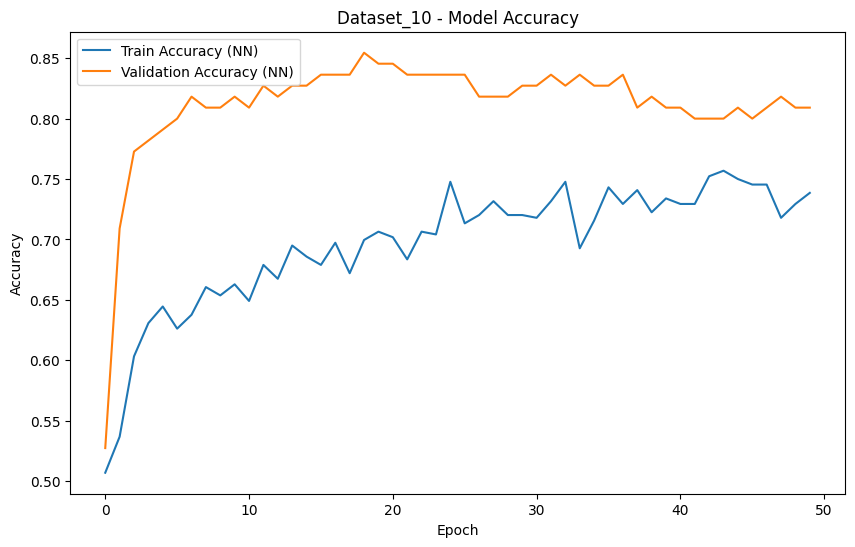

Processing Dataset_11...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.5008 - loss: 0.7203 - val_accuracy: 0.7368 - val_loss: 0.5652
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.4533 - loss: 0.7067 - val_accuracy: 0.8947 - val_loss: 0.5703
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6135 - loss: 0.6749 - val_accuracy: 0.9474 - val_loss: 0.5767
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5838 - loss: 0.6903 - val_accuracy: 0.8947 - val_loss: 0.5832
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6788 - loss: 0.6394 - val_accuracy: 0.8421 - val_loss: 0.5880
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7196 - loss: 0.6322 - val_accuracy: 0.8421 - val_loss: 0.5902
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step


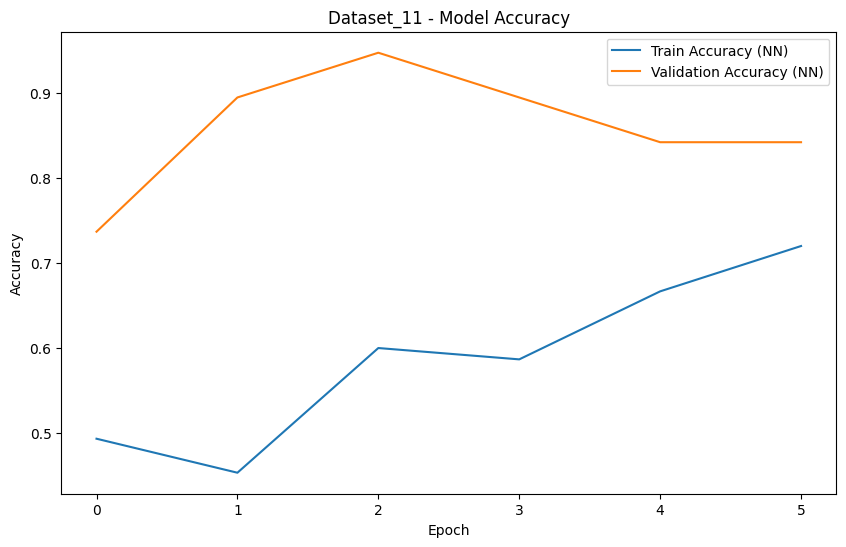

Processing Dataset_12...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.4667 - loss: 0.6954 - val_accuracy: 0.5333 - val_loss: 0.6749
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6037 - loss: 0.6820 - val_accuracy: 0.5778 - val_loss: 0.6667
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6588 - loss: 0.6635 - val_accuracy: 0.6444 - val_loss: 0.6596
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6760 - loss: 0.6588 - val_accuracy: 0.6444 - val_loss: 0.6524
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6958 - loss: 0.6555 - val_accuracy: 0.6889 - val_loss: 0.6454
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6986 - loss: 0.6444 - val_accuracy: 0.6667 - val_loss: 0.6384
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7008 - loss: 0.6421 - val_accuracy: 0.6667 - val_loss: 0.6320
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7422 - loss: 0.6293 - val_accuracy: 0.6667 -

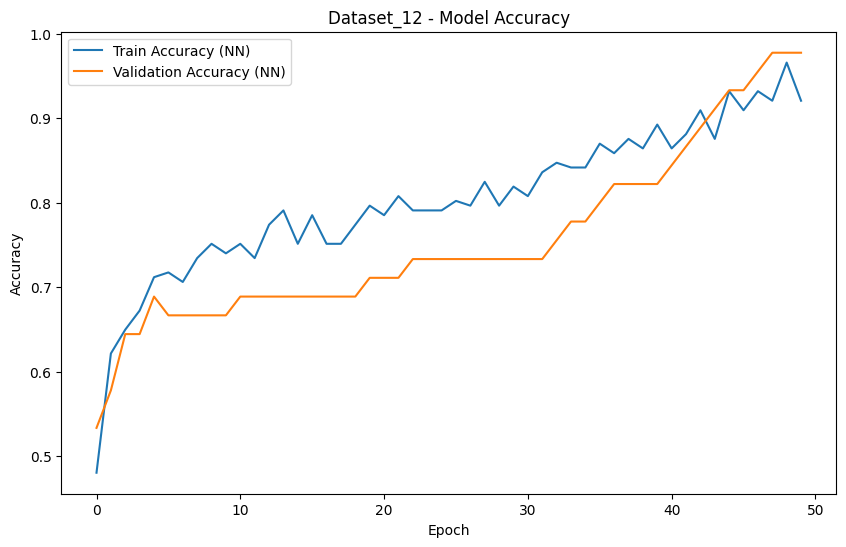

Processing Dataset_13...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.5057 - loss: 0.7094 - val_accuracy: 0.7308 - val_loss: 0.6525
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5964 - loss: 0.6823 - val_accuracy: 0.8077 - val_loss: 0.6276
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6419 - loss: 0.6591 - val_accuracy: 0.8846 - val_loss: 0.6035
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7024 - loss: 0.6338 - val_accuracy: 0.9231 - val_loss: 0.5795
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7593 - loss: 0.6031 - val_accuracy: 0.9231 - val_loss: 0.5562
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7424 - loss: 0.5921 - val_accuracy: 0.9038 - val_loss: 0.5326
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7559 - loss: 0.5870 - val_accuracy: 0.9038 - val_loss: 0.5084
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8136 - loss: 0.5433 - val_accuracy: 0.9231 -

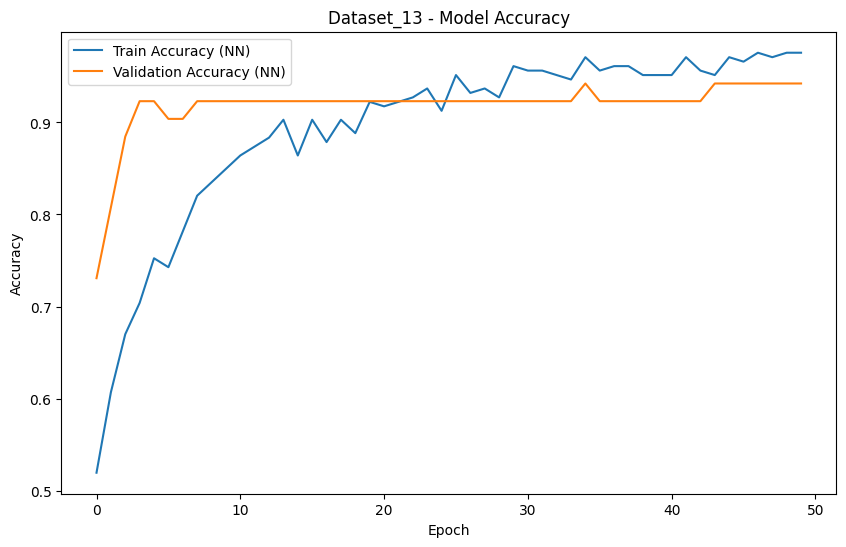

Processing Dataset_14...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4908 - loss: 0.6995 - val_accuracy: 0.6731 - val_loss: 0.6719
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6145 - loss: 0.6493 - val_accuracy: 0.6923 - val_loss: 0.6423
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7179 - loss: 0.6177 - val_accuracy: 0.7308 - val_loss: 0.6131
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7861 - loss: 0.6044 - val_accuracy: 0.7885 - val_loss: 0.5851
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7646 - loss: 0.5903 - val_accuracy: 0.8077 - val_loss: 0.5578
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8406 - loss: 0.5601 - val_accuracy: 0.8462 - val_loss: 0.5303
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8020 - loss: 0.5382 - val_accuracy: 0.8462 - val_loss: 0.5010
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8882 - loss: 0.4904 - val_accuracy: 0.9038 -

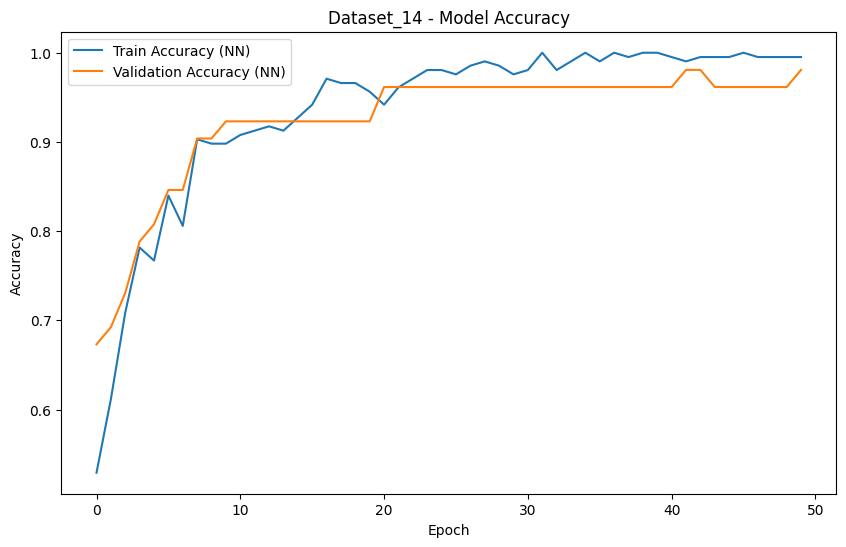

Processing Dataset_15...
Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5390 - loss: 0.6933 - val_accuracy: 0.5900 - val_loss: 0.6775
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5562 - loss: 0.6758 - val_accuracy: 0.6400 - val_loss: 0.6658
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6253 - loss: 0.6590 - val_accuracy: 0.6200 - val_loss: 0.6553
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6667 - loss: 0.6403 - val_accuracy: 0.6500 - val_loss: 0.6444
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6287 - loss: 0.6466 - val_accuracy: 0.6800 - val_loss: 0.6350
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6439 - loss: 0.6386 - val_accuracy: 0.6800 - val_loss: 0.6260
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7161 - loss: 0.6156 - val_accuracy: 0.6500 - val_loss: 0.6181
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6805 - loss: 0.6093 - val_accuracy: 0.6600 -

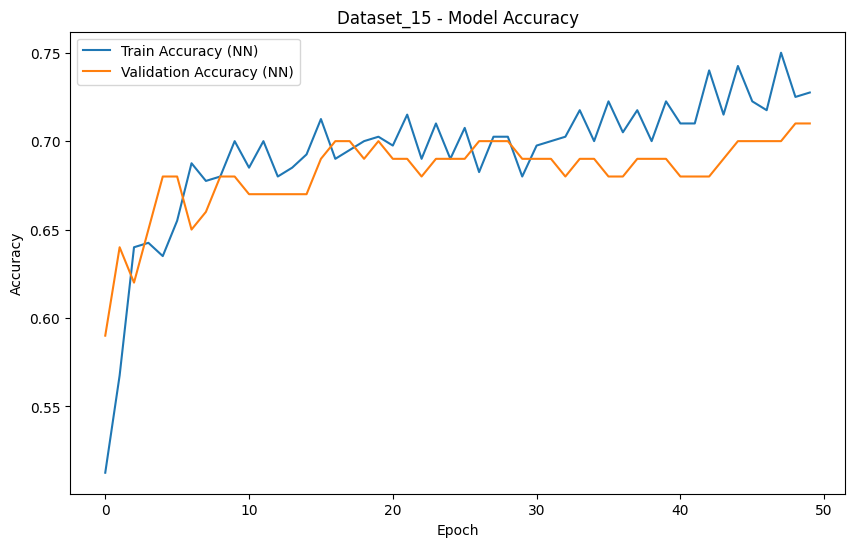

Processing Dataset_16...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5236 - loss: 0.6869 - val_accuracy: 0.7565 - val_loss: 0.6053
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7323 - loss: 0.5876 - val_accuracy: 0.8522 - val_loss: 0.5194
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8855 - loss: 0.4921 - val_accuracy: 0.8870 - val_loss: 0.4362
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8843 - loss: 0.4189 - val_accuracy: 0.9217 - val_loss: 0.3558
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9179 - loss: 0.3547 - val_accuracy: 0.9478 - val_loss: 0.2819
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9351 - loss: 0.2891 - val_accuracy: 0.9652 - val_loss: 0.2204
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9421 - loss: 0.2373 - val_accuracy: 0.9739 - val_loss: 0.1733
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9601 - loss: 0.1934 - val_accuracy: 0.9739 -

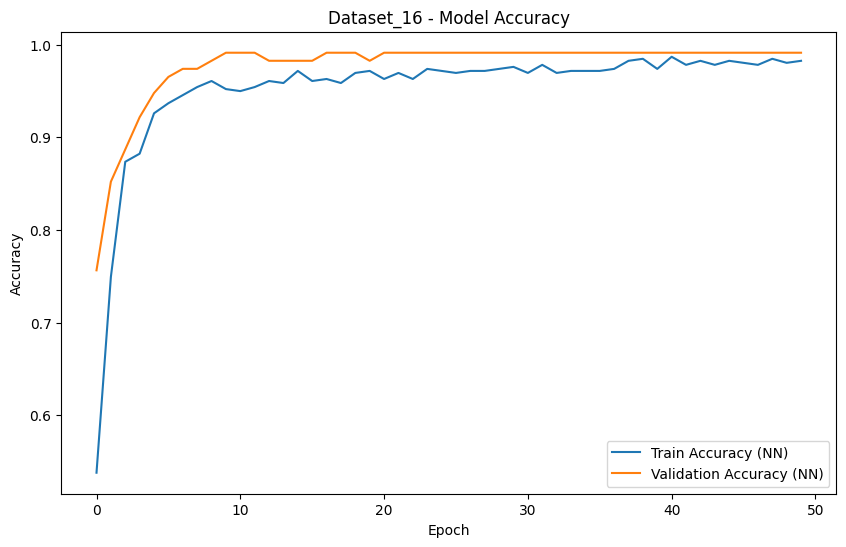

Processing Dataset_17...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - accuracy: 0.4258 - loss: 0.7276 - val_accuracy: 0.3462 - val_loss: 0.7065
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.4829 - loss: 0.7035 - val_accuracy: 0.6154 - val_loss: 0.6725
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.5252 - loss: 0.6691 - val_accuracy: 0.6538 - val_loss: 0.6420
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6854 - loss: 0.6343 - val_accuracy: 0.7308 - val_loss: 0.6138
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7433 - loss: 0.5832 - val_accuracy: 0.7308 - val_loss: 0.5878
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7277 - loss: 0.5908 - val_accuracy: 0.7308 - val_loss: 0.5634
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7752 - loss: 0.5567 - val_accuracy: 0.7308 - val_loss: 0.5409
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7885 - loss: 0.5345 - val_accuracy: 0

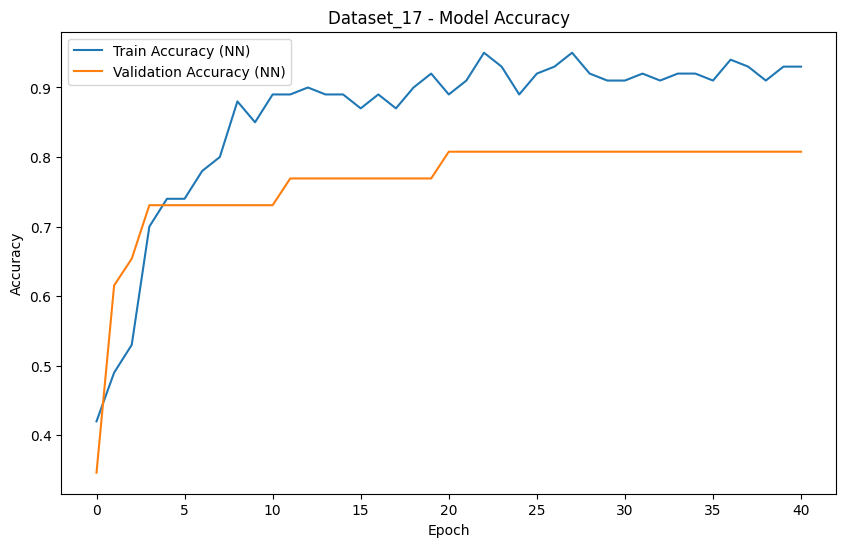

Processing Dataset_18...
Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5269 - loss: 0.7208 - val_accuracy: 0.8372 - val_loss: 0.6267
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7584 - loss: 0.6195 - val_accuracy: 0.9845 - val_loss: 0.5477
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8886 - loss: 0.5474 - val_accuracy: 1.0000 - val_loss: 0.4681
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9230 - loss: 0.4819 - val_accuracy: 1.0000 - val_loss: 0.3877
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9585 - loss: 0.3987 - val_accuracy: 1.0000 - val_loss: 0.3083
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9688 - loss: 0.3299 - val_accuracy: 1.0000 - val_loss: 0.2386
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9698 - loss: 0.2787 - val_accuracy: 1.0000 - val_loss: 0.1821
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9913 - loss: 0.2121 - val_accuracy: 1.0000 -

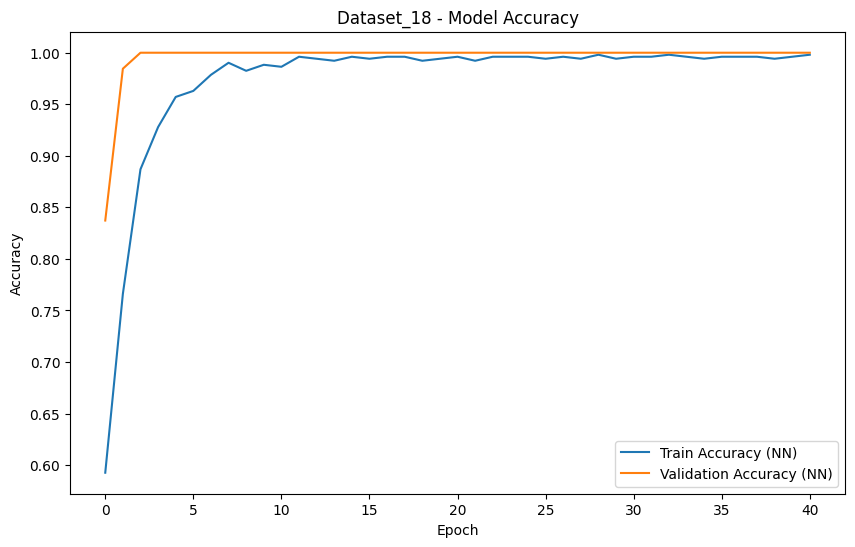

Processing Dataset_19...
Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.6047 - loss: 0.6647 - val_accuracy: 0.8690 - val_loss: 0.5733
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8523 - loss: 0.5688 - val_accuracy: 0.9167 - val_loss: 0.4788
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9044 - loss: 0.4886 - val_accuracy: 0.9167 - val_loss: 0.4003
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9251 - loss: 0.4052 - val_accuracy: 0.9167 - val_loss: 0.3356
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9283 - loss: 0.3386 - val_accuracy: 0.9167 - val_loss: 0.2823
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9372 - loss: 0.2927 - val_accuracy: 0.9167 - val_loss: 0.2382
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9469 - loss: 0.2627 - val_accuracy: 0.9167 - val_loss: 0.2024
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9618 - loss: 0.2083 - val_accuracy: 0.9286 -

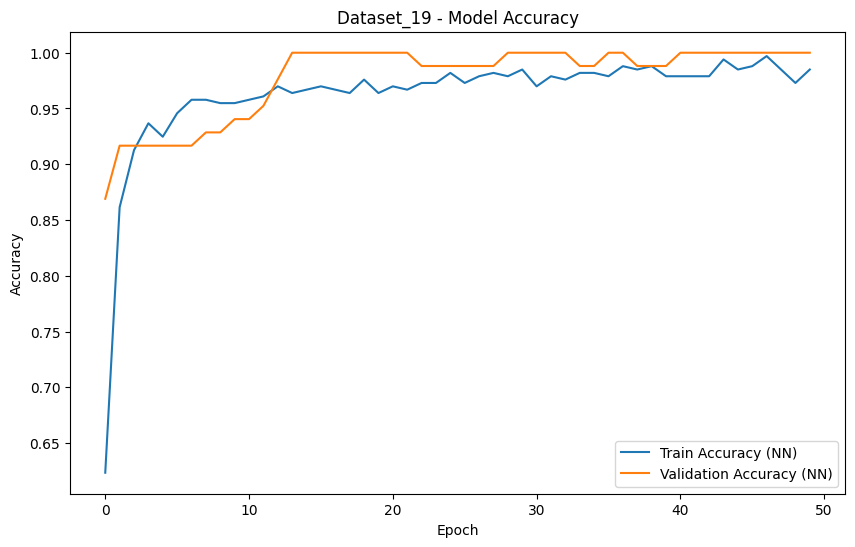

Processing Dataset_2...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5108 - loss: 0.6847 - val_accuracy: 0.7391 - val_loss: 0.5718
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7275 - loss: 0.5568 - val_accuracy: 0.8870 - val_loss: 0.4765
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8661 - loss: 0.4722 - val_accuracy: 0.9130 - val_loss: 0.3978
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9143 - loss: 0.3924 - val_accuracy: 0.9130 - val_loss: 0.3315
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9192 - loss: 0.3353 - val_accuracy: 0.9391 - val_loss: 0.2723
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9339 - loss: 0.2752 - val_accuracy: 0.9391 - val_loss: 0.2222
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9328 - loss: 0.2418 - val_accuracy: 0.9565 - val_loss: 0.1818
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9465 - loss: 0.2034 - val_accuracy: 0.9652 - 

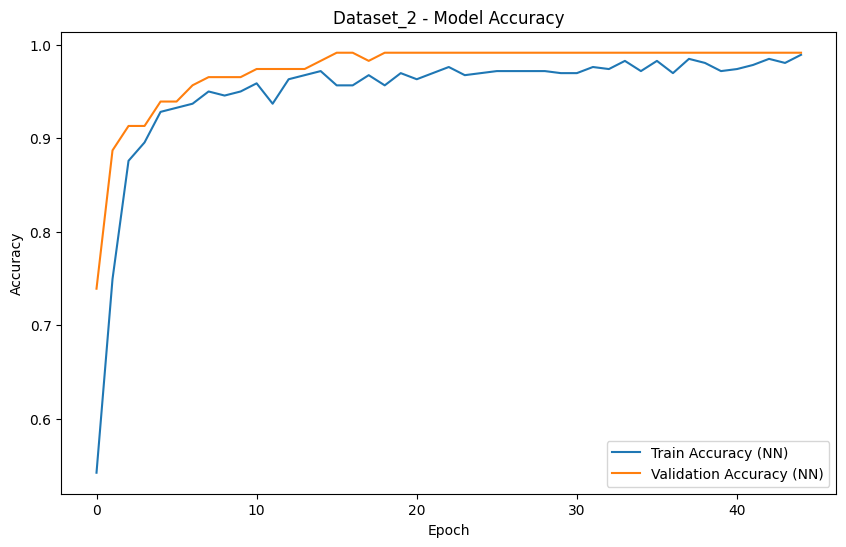

Processing Dataset_20...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - accuracy: 0.5513 - loss: 0.6936 - val_accuracy: 0.6216 - val_loss: 0.6700
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5459 - loss: 0.6732 - val_accuracy: 0.7568 - val_loss: 0.6559
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6808 - loss: 0.6483 - val_accuracy: 0.8108 - val_loss: 0.6417
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7582 - loss: 0.6311 - val_accuracy: 0.8108 - val_loss: 0.6271
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7807 - loss: 0.6165 - val_accuracy: 0.8108 - val_loss: 0.6128
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7891 - loss: 0.6011 - val_accuracy: 0.8108 - val_loss: 0.5989
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8014 - loss: 0.5899 - val_accuracy: 0.8378 - val_loss: 0.5845
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8151 - loss: 0.5779 - val_accuracy: 0.8649 -

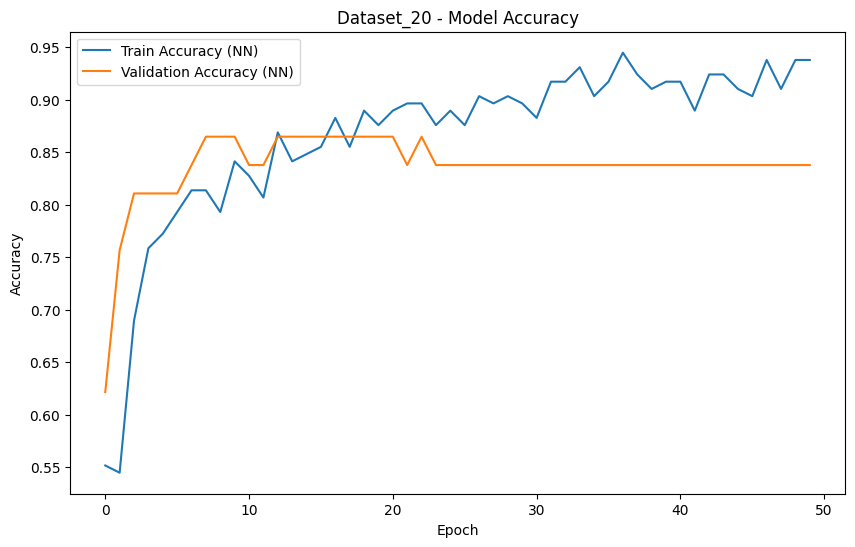

Processing Dataset_21...
Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.4737 - loss: 0.6906 - val_accuracy: 0.7143 - val_loss: 0.6783
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6244 - loss: 0.6745 - val_accuracy: 0.7857 - val_loss: 0.6546
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7837 - loss: 0.6333 - val_accuracy: 0.7857 - val_loss: 0.6318
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7669 - loss: 0.6071 - val_accuracy: 0.7857 - val_loss: 0.6072
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7898 - loss: 0.5877 - val_accuracy: 0.7714 - val_loss: 0.5812
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7649 - loss: 0.5631 - val_accuracy: 0.7714 - val_loss: 0.5552
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8183 - loss: 0.5225 - val_accuracy: 0.7714 - val_loss: 0.5309
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7992 - loss: 0.5036 - val_accuracy: 0.7714 -

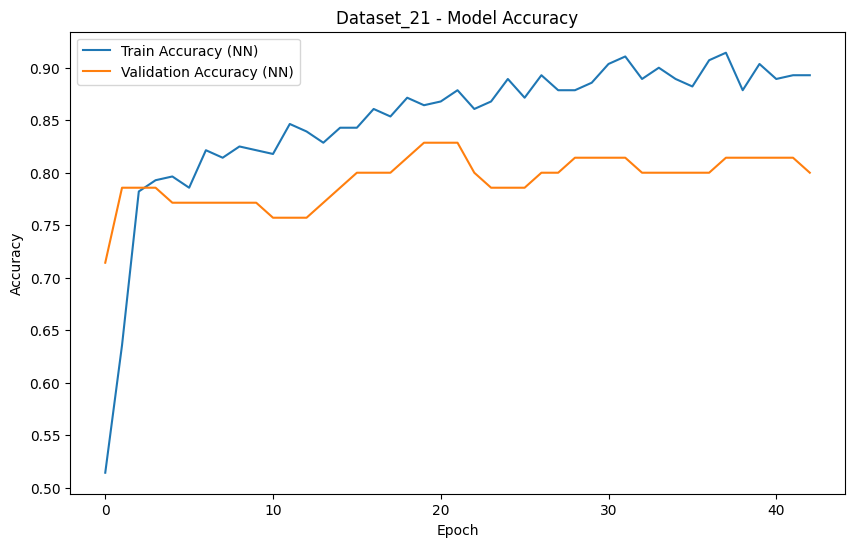

Processing Dataset_22...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - accuracy: 0.4942 - loss: 0.6967 - val_accuracy: 0.5152 - val_loss: 0.6898
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5370 - loss: 0.6882 - val_accuracy: 0.6061 - val_loss: 0.6818
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5370 - loss: 0.6914 - val_accuracy: 0.6667 - val_loss: 0.6746
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6227 - loss: 0.6816 - val_accuracy: 0.6667 - val_loss: 0.6685
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5896 - loss: 0.6753 - val_accuracy: 0.6667 - val_loss: 0.6629
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6634 - loss: 0.6713 - val_accuracy: 0.6970 - val_loss: 0.6574
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6615 - loss: 0.6590 - val_accuracy: 0.6970 - val_loss: 0.6524
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6653 - loss: 0.6566 - val_accuracy: 0.6970 -

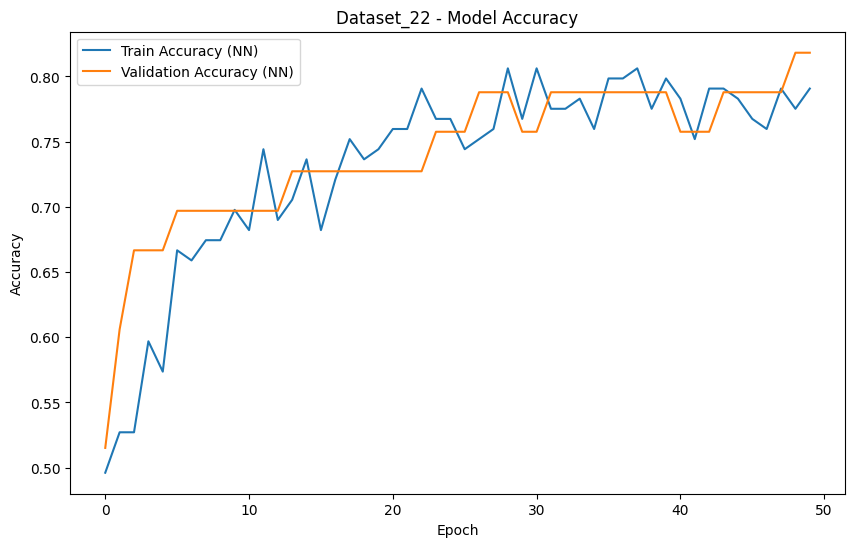

Processing Dataset_23...
Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6462 - loss: 0.6601 - val_accuracy: 0.8276 - val_loss: 0.6096
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7657 - loss: 0.5978 - val_accuracy: 0.8621 - val_loss: 0.5633
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8095 - loss: 0.5542 - val_accuracy: 0.8506 - val_loss: 0.5195
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8003 - loss: 0.5372 - val_accuracy: 0.8506 - val_loss: 0.4781
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8349 - loss: 0.5081 - val_accuracy: 0.8506 - val_loss: 0.4399
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8275 - loss: 0.4644 - val_accuracy: 0.8621 - val_loss: 0.4070
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8427 - loss: 0.4234 - val_accuracy: 0.8851 - val_loss: 0.3797
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8533 - loss: 0.4117 - val_accuracy: 0.8966 -

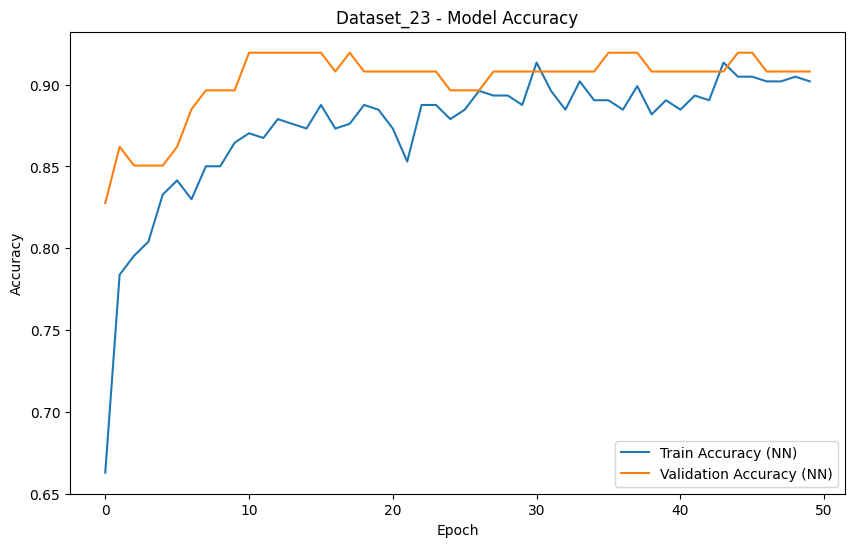

Processing Dataset_24...
Epoch 1/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5092 - loss: 0.6996 - val_accuracy: 0.6433 - val_loss: 0.6615
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5935 - loss: 0.6726 - val_accuracy: 0.6608 - val_loss: 0.6414
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6327 - loss: 0.6568 - val_accuracy: 0.6550 - val_loss: 0.6250
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6202 - loss: 0.6502 - val_accuracy: 0.6608 - val_loss: 0.6133
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6629 - loss: 0.6203 - val_accuracy: 0.6491 - val_loss: 0.6056
Epoch 6/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6500 - loss: 0.6209 - val_accuracy: 0.6667 - val_loss: 0.6015
Epoch 7/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6498 - loss: 0.6195 - val_accuracy: 0.6667 - val_loss: 0.6000
Epoch 8/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6565 - loss: 0.6173 - val_acc

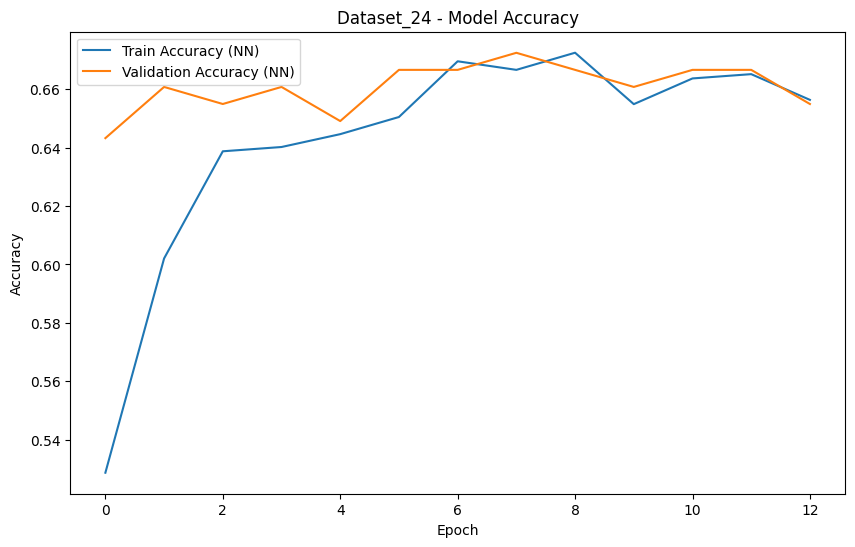

Processing Dataset_25...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5079 - loss: 0.7020 - val_accuracy: 0.5143 - val_loss: 0.7159
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5468 - loss: 0.6971 - val_accuracy: 0.5429 - val_loss: 0.7053
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5299 - loss: 0.6869 - val_accuracy: 0.4571 - val_loss: 0.6955
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5710 - loss: 0.6876 - val_accuracy: 0.5143 - val_loss: 0.6861
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6349 - loss: 0.6709 - val_accuracy: 0.5143 - val_loss: 0.6774
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6166 - loss: 0.6660 - val_accuracy: 0.5429 - val_loss: 0.6699
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6336 - loss: 0.6601 - val_accuracy: 0.5429 - val_loss: 0.6636
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6212 - loss: 0.6547 - val_accuracy: 0.5429 -

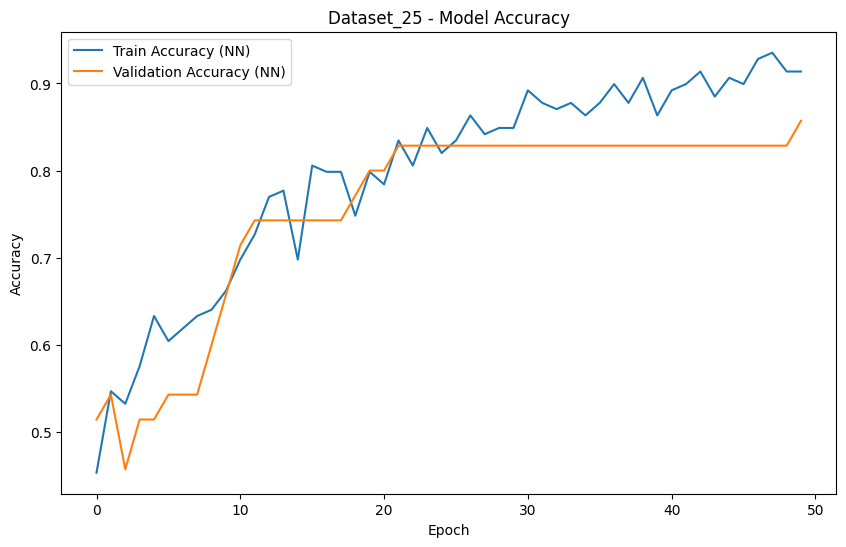

Processing Dataset_26...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - accuracy: 0.4977 - loss: 0.7802 - val_accuracy: 0.4565 - val_loss: 0.7597
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5070 - loss: 0.7205 - val_accuracy: 0.4565 - val_loss: 0.7339
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5168 - loss: 0.7076 - val_accuracy: 0.4783 - val_loss: 0.7127
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6072 - loss: 0.6676 - val_accuracy: 0.5217 - val_loss: 0.6957
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5501 - loss: 0.6681 - val_accuracy: 0.5217 - val_loss: 0.6808
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5686 - loss: 0.6734 - val_accuracy: 0.6739 - val_loss: 0.6672
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6860 - loss: 0.6344 - val_accuracy: 0.6957 - val_loss: 0.6538
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6101 - loss: 0.6392 - val_accuracy: 0.695

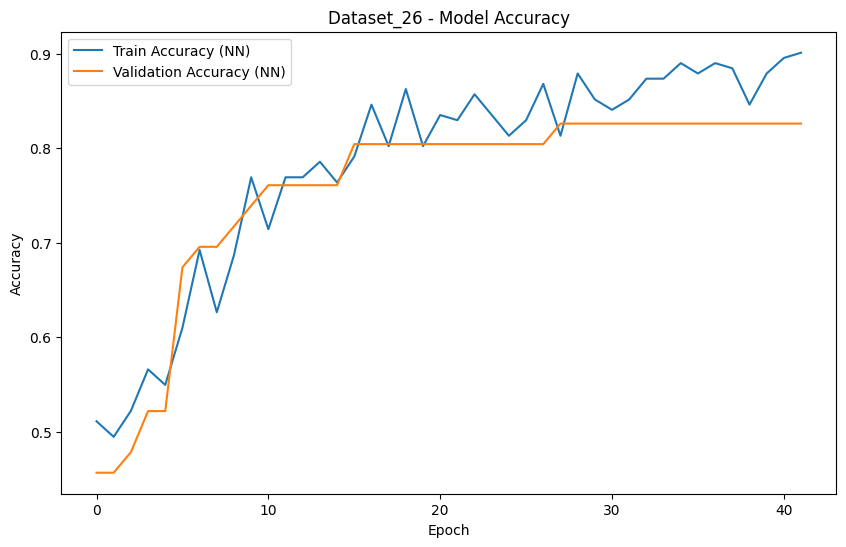

Processing Dataset_27...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.4128 - loss: 0.7063 - val_accuracy: 0.6739 - val_loss: 0.6725
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6908 - loss: 0.6628 - val_accuracy: 0.9348 - val_loss: 0.6411
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8152 - loss: 0.6470 - val_accuracy: 1.0000 - val_loss: 0.6097
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8888 - loss: 0.6125 - val_accuracy: 1.0000 - val_loss: 0.5789
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9291 - loss: 0.5980 - val_accuracy: 1.0000 - val_loss: 0.5488
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9585 - loss: 0.5654 - val_accuracy: 1.0000 - val_loss: 0.5189
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9773 - loss: 0.5378 - val_accuracy: 1.0000 - val_loss: 0.4892
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9620 - loss: 0.5139 - val_accuracy: 1.0000 -

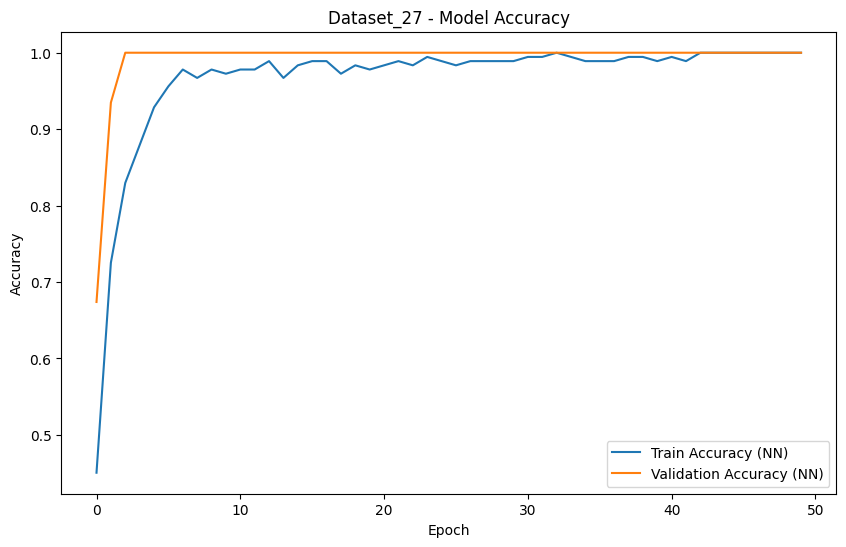

Processing Dataset_28...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4477 - loss: 0.7083 - val_accuracy: 0.6000 - val_loss: 0.6846
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5856 - loss: 0.6699 - val_accuracy: 0.7417 - val_loss: 0.6482
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7501 - loss: 0.6362 - val_accuracy: 0.7667 - val_loss: 0.6126
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7430 - loss: 0.6019 - val_accuracy: 0.7417 - val_loss: 0.5762
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7985 - loss: 0.5575 - val_accuracy: 0.7250 - val_loss: 0.5409
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7748 - loss: 0.5387 - val_accuracy: 0.7500 - val_loss: 0.5103
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7827 - loss: 0.4912 - val_accuracy: 0.7583 - val_loss: 0.4887
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7856 - loss: 0.4882 - val_accuracy: 0.7583 -

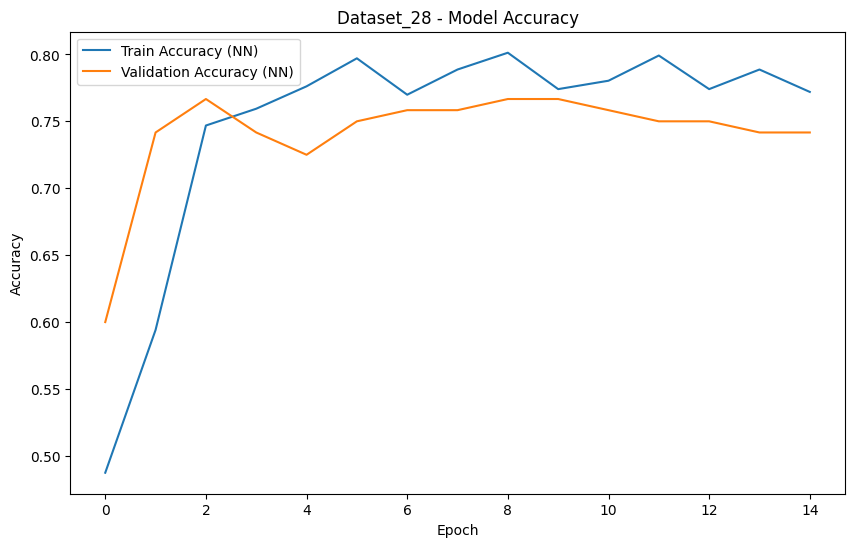

Processing Dataset_29...
Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5145 - loss: 0.6978 - val_accuracy: 0.5429 - val_loss: 0.6488
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5720 - loss: 0.6626 - val_accuracy: 0.8000 - val_loss: 0.6119
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7384 - loss: 0.6150 - val_accuracy: 0.8000 - val_loss: 0.5805
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7750 - loss: 0.5838 - val_accuracy: 0.7857 - val_loss: 0.5505
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8088 - loss: 0.5563 - val_accuracy: 0.7857 - val_loss: 0.5233
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7888 - loss: 0.5391 - val_accuracy: 0.7857 - val_loss: 0.4995
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7975 - loss: 0.5015 - val_accuracy: 0.7714 - val_loss: 0.4776
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7899 - loss: 0.5042 - val_accuracy: 0.7714 -

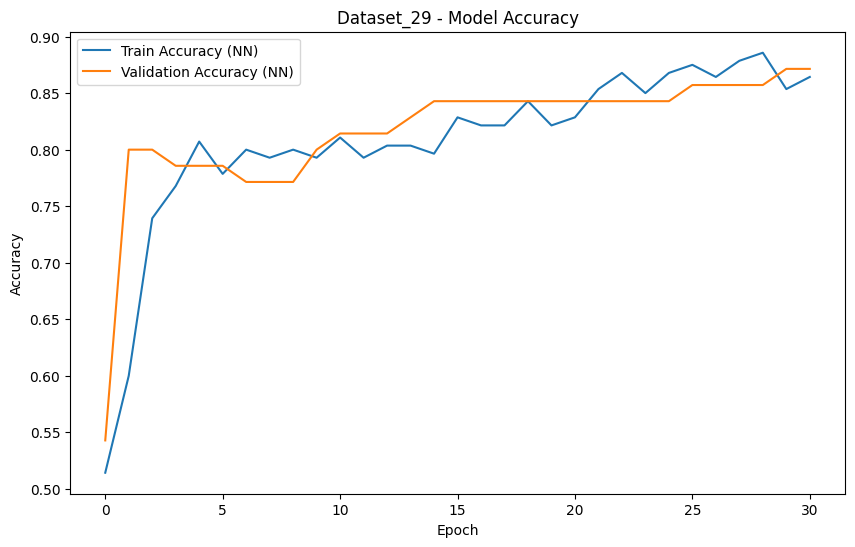

Processing Dataset_3...
Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step - accuracy: 0.5536 - loss: 0.6856 - val_accuracy: 0.7857 - val_loss: 0.6917
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5357 - loss: 0.6786 - val_accuracy: 0.7143 - val_loss: 0.6903
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.4643 - loss: 0.7030 - val_accuracy: 0.7857 - val_loss: 0.6894
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.6429 - loss: 0.6639 - val_accuracy: 0.7857 - val_loss: 0.6883
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5179 - loss: 0.6710 - val_accuracy: 0.7857 - val_loss: 0.6871
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5179 - loss: 0.6765 - val_accuracy: 0.7857 - val_loss: 0.6859
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.6071 - loss: 0.6712 - val_accuracy: 0.7857 - val_loss: 0.6847
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5536 - loss: 0.6810 - val_accuracy: 0

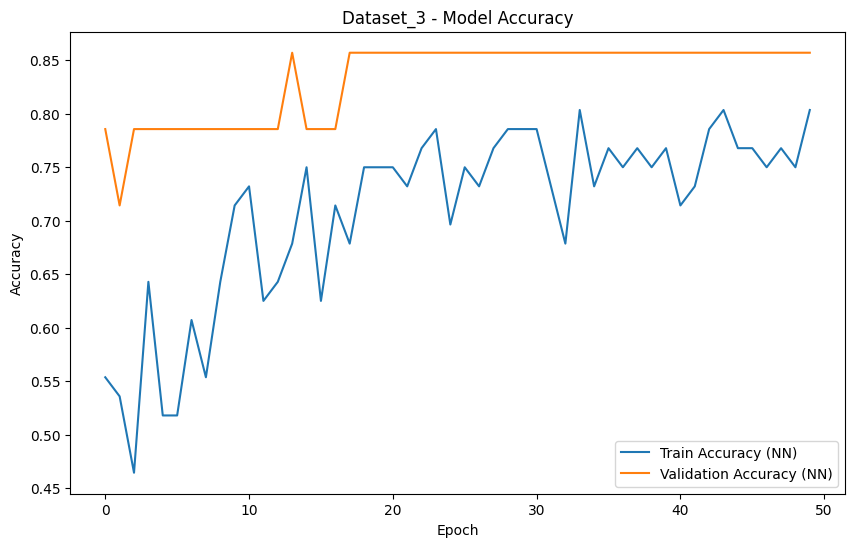

Processing Dataset_30...
Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5747 - loss: 0.6796 - val_accuracy: 0.6479 - val_loss: 0.6606
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6314 - loss: 0.6612 - val_accuracy: 0.6761 - val_loss: 0.6340
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6855 - loss: 0.6406 - val_accuracy: 0.6901 - val_loss: 0.6103
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6634 - loss: 0.6239 - val_accuracy: 0.6901 - val_loss: 0.5925
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6546 - loss: 0.6018 - val_accuracy: 0.6620 - val_loss: 0.5759
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7315 - loss: 0.5583 - val_accuracy: 0.6901 - val_loss: 0.5596
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6948 - loss: 0.5641 - val_accuracy: 0.6901 - val_loss: 0.5489
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6934 - loss: 0.5449 - val_accuracy: 0.6972 -

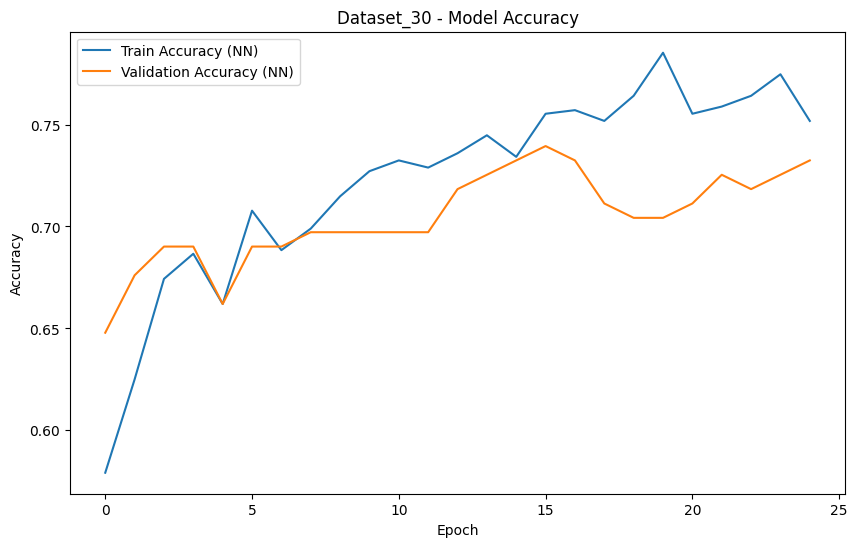

Processing Dataset_31...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.4560 - loss: 0.7383 - val_accuracy: 0.3333 - val_loss: 0.7344
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5156 - loss: 0.7136 - val_accuracy: 0.2917 - val_loss: 0.7154
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5246 - loss: 0.7025 - val_accuracy: 0.3333 - val_loss: 0.6985
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5407 - loss: 0.6949 - val_accuracy: 0.5000 - val_loss: 0.6819
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5246 - loss: 0.6774 - val_accuracy: 0.5000 - val_loss: 0.6660
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5724 - loss: 0.6657 - val_accuracy: 0.7083 - val_loss: 0.6508
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5530 - loss: 0.6451 - val_accuracy: 0.7083 - val_loss: 0.6363
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5653 - loss: 0.6449 - val_accuracy: 0

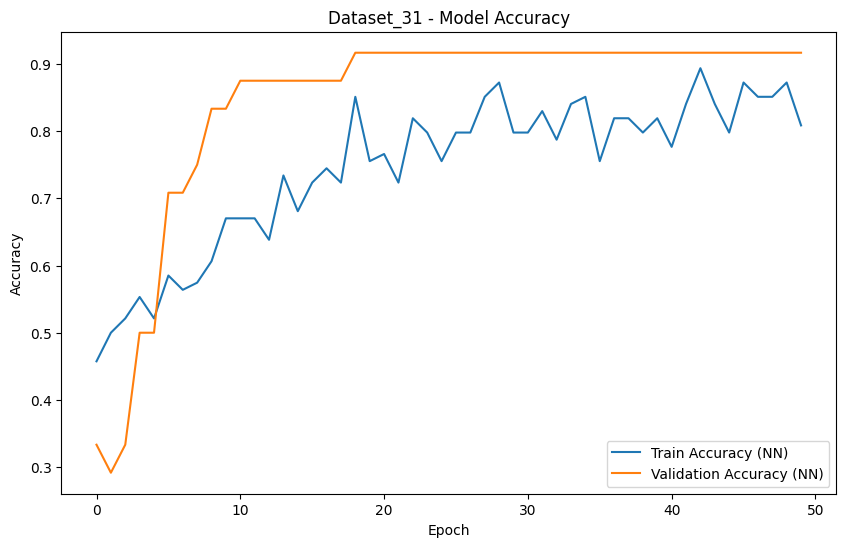

Processing Dataset_32...
Epoch 1/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5721 - loss: 0.6820 - val_accuracy: 0.7931 - val_loss: 0.6471
Epoch 2/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7217 - loss: 0.6485 - val_accuracy: 0.7833 - val_loss: 0.6076
Epoch 3/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7382 - loss: 0.6037 - val_accuracy: 0.7734 - val_loss: 0.5649
Epoch 4/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7289 - loss: 0.5795 - val_accuracy: 0.7734 - val_loss: 0.5299
Epoch 5/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7521 - loss: 0.5372 - val_accuracy: 0.7734 - val_loss: 0.5099
Epoch 6/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7606 - loss: 0.5285 - val_accuracy: 0.7783 - val_loss: 0.5036
Epoch 7/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7450 - loss: 0.5259 - val_accuracy: 0.7685 - val_loss: 0.5027
Epoch 8/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7499 - loss: 0.5166 - val_acc

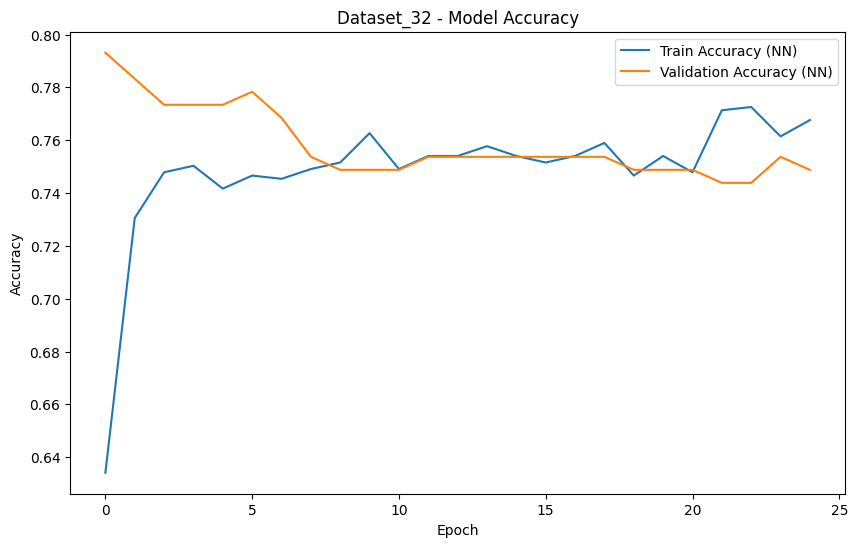

Processing Dataset_33...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.3869 - loss: 0.7977 - val_accuracy: 0.5738 - val_loss: 0.7094
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4782 - loss: 0.7225 - val_accuracy: 0.6393 - val_loss: 0.6455
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6654 - loss: 0.6419 - val_accuracy: 0.9672 - val_loss: 0.5889
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7713 - loss: 0.6083 - val_accuracy: 0.9672 - val_loss: 0.5382
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8531 - loss: 0.5636 - val_accuracy: 0.9672 - val_loss: 0.4902
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9067 - loss: 0.5200 - val_accuracy: 0.9836 - val_loss: 0.4434
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9467 - loss: 0.4700 - val_accuracy: 0.9836 - val_loss: 0.3961
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9237 - loss: 0.4309 - val_accuracy: 0.9836 -

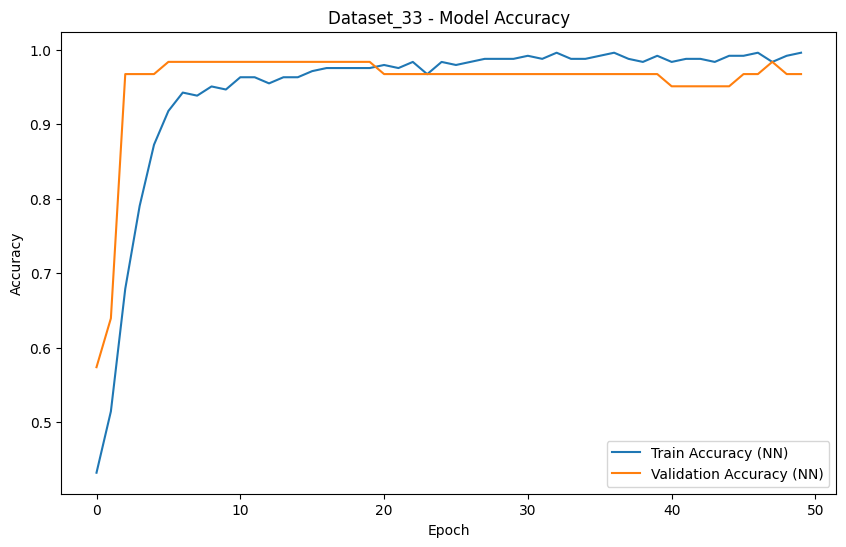

Processing Dataset_34...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.5057 - loss: 0.7014 - val_accuracy: 0.7778 - val_loss: 0.6539
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6332 - loss: 0.6611 - val_accuracy: 0.7937 - val_loss: 0.6128
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6978 - loss: 0.6211 - val_accuracy: 0.7937 - val_loss: 0.5760
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7737 - loss: 0.5985 - val_accuracy: 0.7937 - val_loss: 0.5444
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7472 - loss: 0.5830 - val_accuracy: 0.7937 - val_loss: 0.5181
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7631 - loss: 0.5469 - val_accuracy: 0.7937 - val_loss: 0.4964
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7506 - loss: 0.5334 - val_accuracy: 0.7937 - val_loss: 0.4799
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7622 - loss: 0.5326 - val_accuracy: 0.7937 -

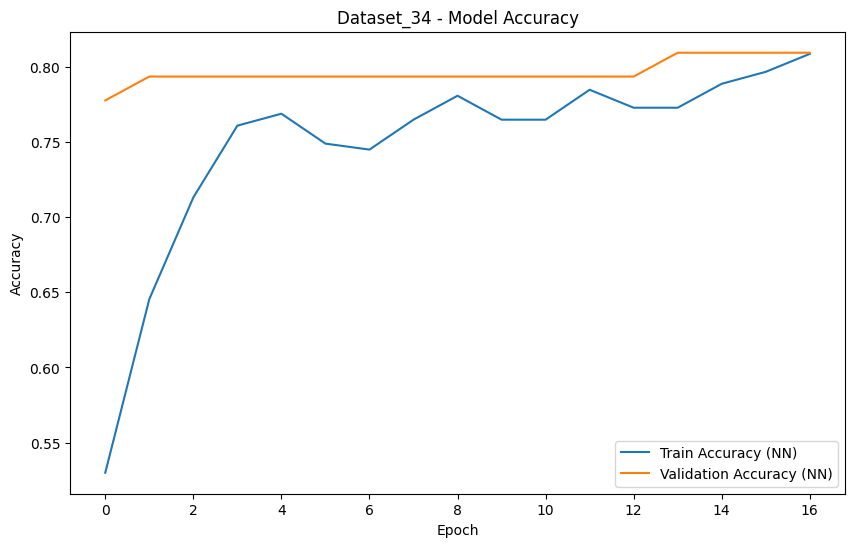

Processing Dataset_35...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5243 - loss: 0.7092 - val_accuracy: 0.6250 - val_loss: 0.6669
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5992 - loss: 0.6687 - val_accuracy: 0.7667 - val_loss: 0.6356
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6706 - loss: 0.6502 - val_accuracy: 0.7667 - val_loss: 0.6082
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7281 - loss: 0.6122 - val_accuracy: 0.7750 - val_loss: 0.5791
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7397 - loss: 0.5905 - val_accuracy: 0.7750 - val_loss: 0.5502
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7402 - loss: 0.5527 - val_accuracy: 0.7667 - val_loss: 0.5226
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7408 - loss: 0.5439 - val_accuracy: 0.7583 - val_loss: 0.5007
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7439 - loss: 0.5207 - val_accuracy: 0.7583 -

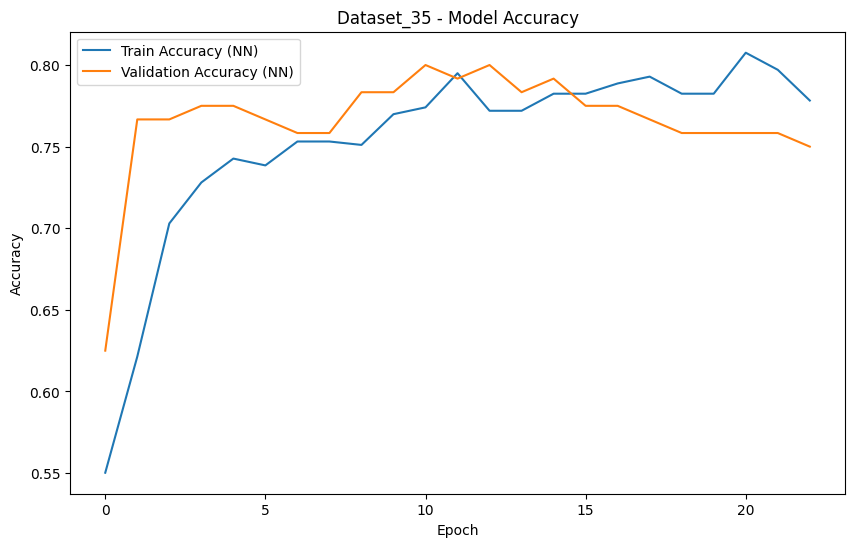

Processing Dataset_36...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.5846 - loss: 0.7036 - val_accuracy: 0.5455 - val_loss: 0.7197
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5097 - loss: 0.7326 - val_accuracy: 0.5455 - val_loss: 0.6934
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5710 - loss: 0.6679 - val_accuracy: 0.5909 - val_loss: 0.6675
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6050 - loss: 0.6556 - val_accuracy: 0.6591 - val_loss: 0.6431
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5934 - loss: 0.6514 - val_accuracy: 0.7500 - val_loss: 0.6209
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6285 - loss: 0.6327 - val_accuracy: 0.7955 - val_loss: 0.6018
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7325 - loss: 0.6090 - val_accuracy: 0.7955 - val_loss: 0.5846
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6701 - loss: 0.5959 - val_accuracy: 0.8182 -

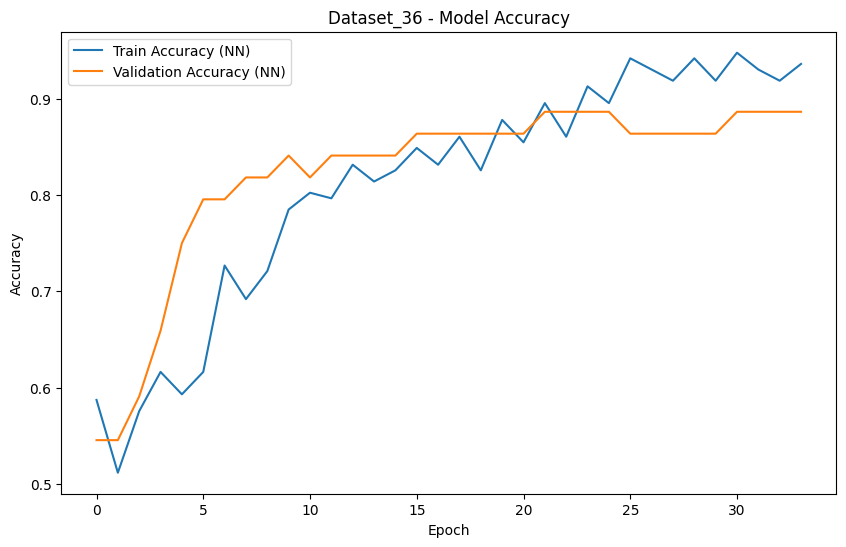

Processing Dataset_37...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - accuracy: 0.5825 - loss: 0.6794 - val_accuracy: 0.5000 - val_loss: 0.6885
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6420 - loss: 0.6665 - val_accuracy: 0.6316 - val_loss: 0.6753
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7172 - loss: 0.6553 - val_accuracy: 0.6053 - val_loss: 0.6616
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7487 - loss: 0.6256 - val_accuracy: 0.6316 - val_loss: 0.6479
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7278 - loss: 0.6252 - val_accuracy: 0.6579 - val_loss: 0.6340
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7239 - loss: 0.6134 - val_accuracy: 0.7105 - val_loss: 0.6196
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7958 - loss: 0.5838 - val_accuracy: 0.7368 - val_loss: 0.6051
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7965 - loss: 0.5665 - val_accuracy: 0.7368 

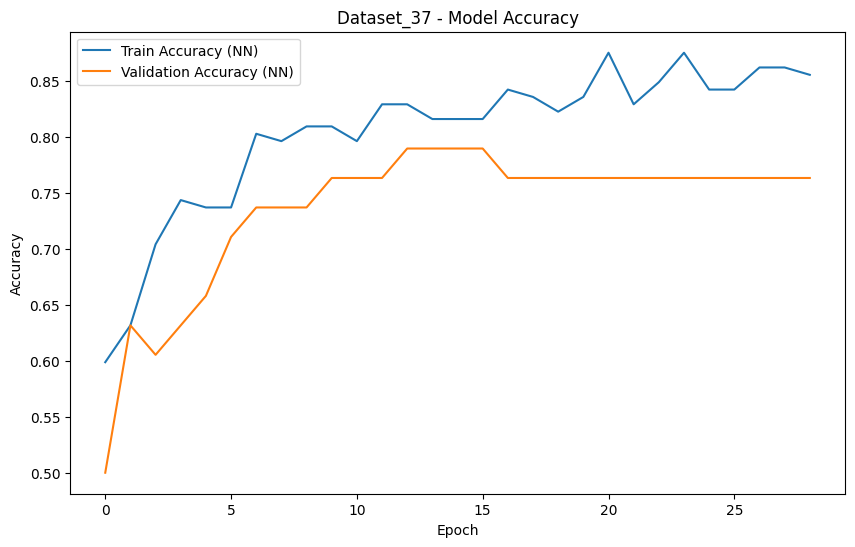

Processing Dataset_38...
Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5186 - loss: 0.6825 - val_accuracy: 0.5300 - val_loss: 0.6795
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5733 - loss: 0.6703 - val_accuracy: 0.6000 - val_loss: 0.6583
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5890 - loss: 0.6641 - val_accuracy: 0.6500 - val_loss: 0.6397
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6507 - loss: 0.6378 - val_accuracy: 0.6500 - val_loss: 0.6237
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6399 - loss: 0.6305 - val_accuracy: 0.7100 - val_loss: 0.6103
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6222 - loss: 0.6196 - val_accuracy: 0.7100 - val_loss: 0.5996
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6628 - loss: 0.5997 - val_accuracy: 0.7400 - val_loss: 0.5890
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7154 - loss: 0.5922 - val_accuracy: 0.7500 -

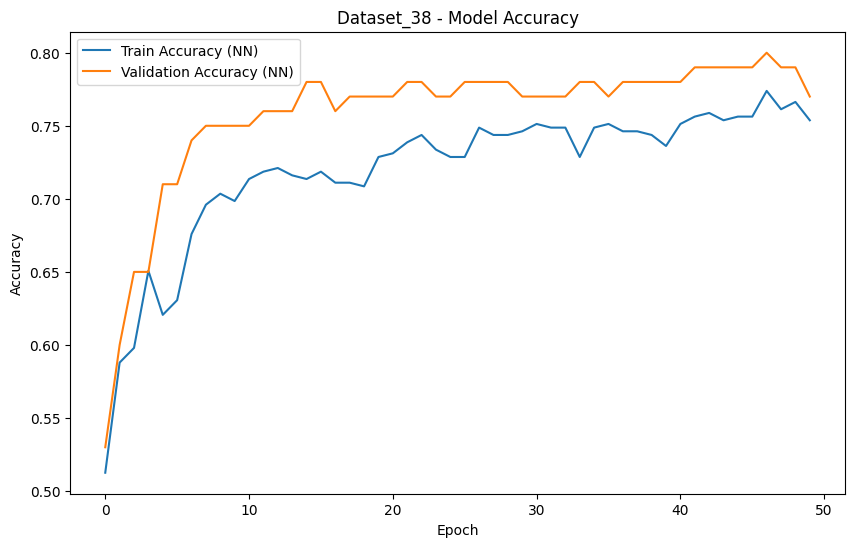

Processing Dataset_39...
Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4639 - loss: 0.7091 - val_accuracy: 0.7394 - val_loss: 0.6555
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6827 - loss: 0.6322 - val_accuracy: 0.9085 - val_loss: 0.5847
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8038 - loss: 0.5816 - val_accuracy: 0.9507 - val_loss: 0.5024
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8998 - loss: 0.4852 - val_accuracy: 0.9507 - val_loss: 0.4069
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9209 - loss: 0.4010 - val_accuracy: 0.9507 - val_loss: 0.3142
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9193 - loss: 0.3139 - val_accuracy: 0.9577 - val_loss: 0.2382
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9368 - loss: 0.2459 - val_accuracy: 0.9577 - val_loss: 0.1856
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9435 - loss: 0.2048 - val_accuracy: 0.9577 -

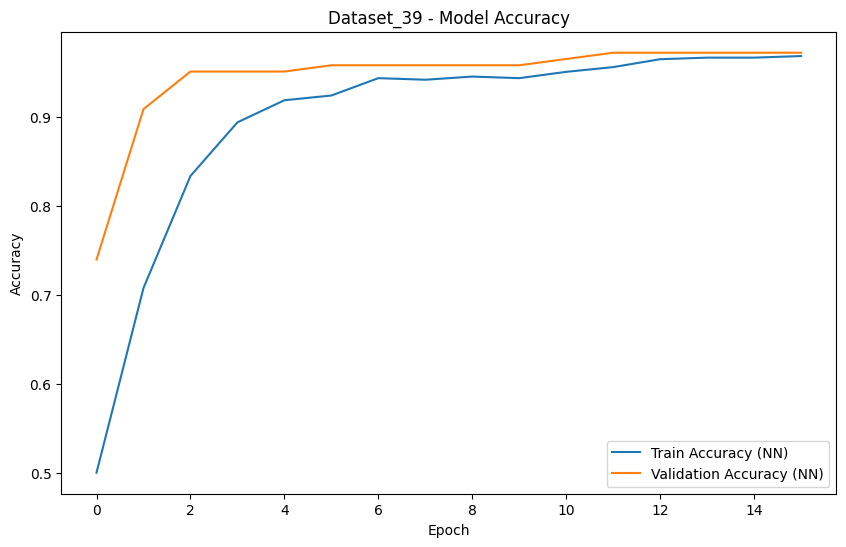

Processing Dataset_4...
Epoch 1/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5548 - loss: 0.6932 - val_accuracy: 0.7385 - val_loss: 0.6439
Epoch 2/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6537 - loss: 0.6537 - val_accuracy: 0.7231 - val_loss: 0.6105
Epoch 3/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6695 - loss: 0.6277 - val_accuracy: 0.7436 - val_loss: 0.5850
Epoch 4/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7144 - loss: 0.6023 - val_accuracy: 0.7077 - val_loss: 0.5610
Epoch 5/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7219 - loss: 0.5854 - val_accuracy: 0.7231 - val_loss: 0.5431
Epoch 6/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7440 - loss: 0.5639 - val_accuracy: 0.7179 - val_loss: 0.5229
Epoch 7/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7200 - loss: 0.5424 - val_accuracy: 0.7436 - val_loss: 0.5051
Epoch 8/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7422 - loss: 0.5246 - val_acc

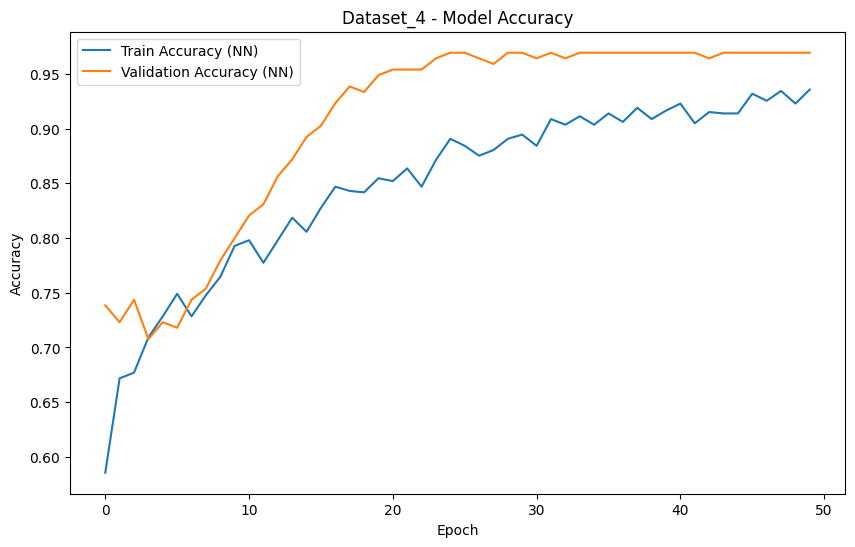

Processing Dataset_40...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5498 - loss: 0.6883 - val_accuracy: 0.6583 - val_loss: 0.6647
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6328 - loss: 0.6698 - val_accuracy: 0.7333 - val_loss: 0.6374
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7124 - loss: 0.6365 - val_accuracy: 0.7417 - val_loss: 0.6109
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7240 - loss: 0.6192 - val_accuracy: 0.7417 - val_loss: 0.5828
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7194 - loss: 0.5855 - val_accuracy: 0.7417 - val_loss: 0.5520
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7617 - loss: 0.5582 - val_accuracy: 0.7417 - val_loss: 0.5215
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7535 - loss: 0.5246 - val_accuracy: 0.7417 - val_loss: 0.4937
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7495 - loss: 0.5219 - val_accuracy: 0.7417 -

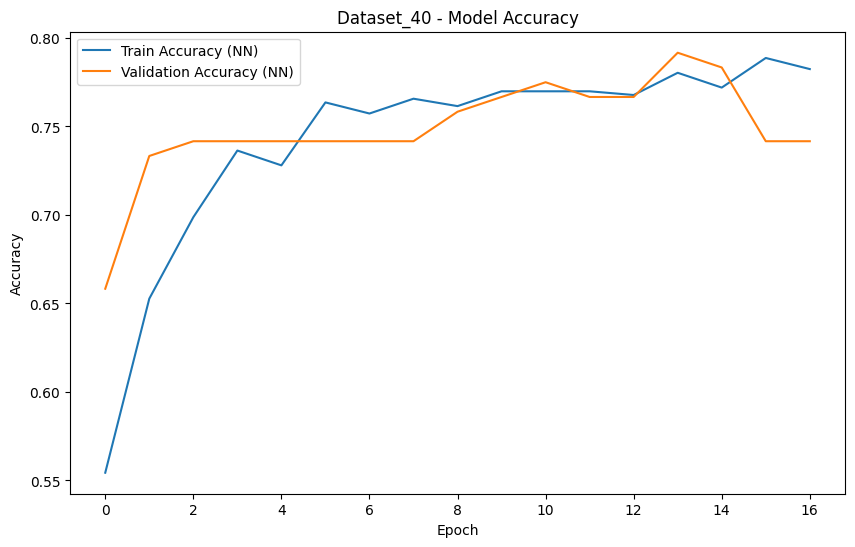

Processing Dataset_41...
Epoch 1/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.4958 - loss: 0.7128 - val_accuracy: 0.8324 - val_loss: 0.6197
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7752 - loss: 0.6104 - val_accuracy: 0.8844 - val_loss: 0.5299
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8798 - loss: 0.5156 - val_accuracy: 0.8844 - val_loss: 0.4530
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8711 - loss: 0.4539 - val_accuracy: 0.8902 - val_loss: 0.3990
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8850 - loss: 0.3728 - val_accuracy: 0.8902 - val_loss: 0.3659
Epoch 6/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8811 - loss: 0.3664 - val_accuracy: 0.8844 - val_loss: 0.3514
Epoch 7/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8863 - loss: 0.3293 - val_accuracy: 0.8844 - val_loss: 0.3430
Epoch 8/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8660 - loss: 0.3511 - val_acc

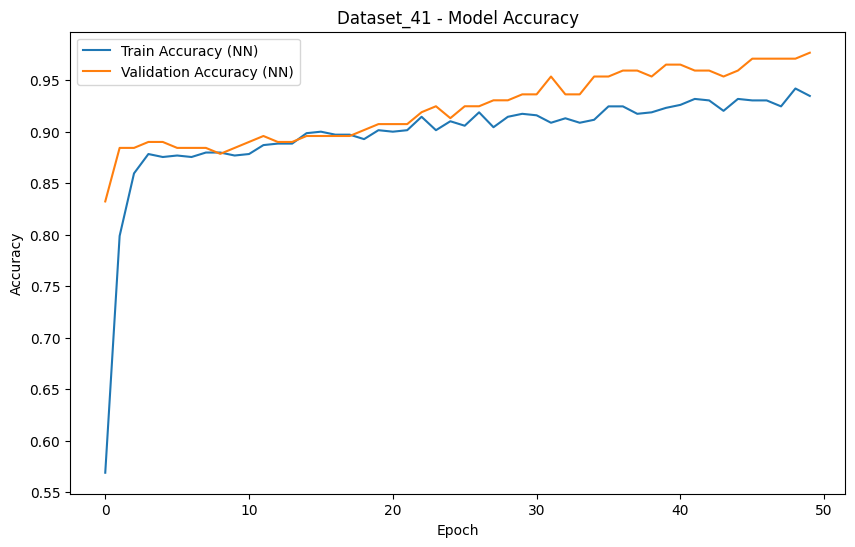

Processing Dataset_42...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - accuracy: 0.6917 - loss: 0.6503 - val_accuracy: 0.6400 - val_loss: 0.6538
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.7327 - loss: 0.6365 - val_accuracy: 0.8400 - val_loss: 0.6386
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.7103 - loss: 0.6332 - val_accuracy: 0.8800 - val_loss: 0.6237
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.8282 - loss: 0.6001 - val_accuracy: 0.8800 - val_loss: 0.6090
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.9014 - loss: 0.5866 - val_accuracy: 0.8800 - val_loss: 0.5942
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9097 - loss: 0.5705 - val_accuracy: 0.8800 - val_loss: 0.5795
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.9066 - loss: 0.5455 - val_accuracy: 0.8800 - val_loss: 0.5646
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9507 - loss: 0.5180 - val_accuracy: 

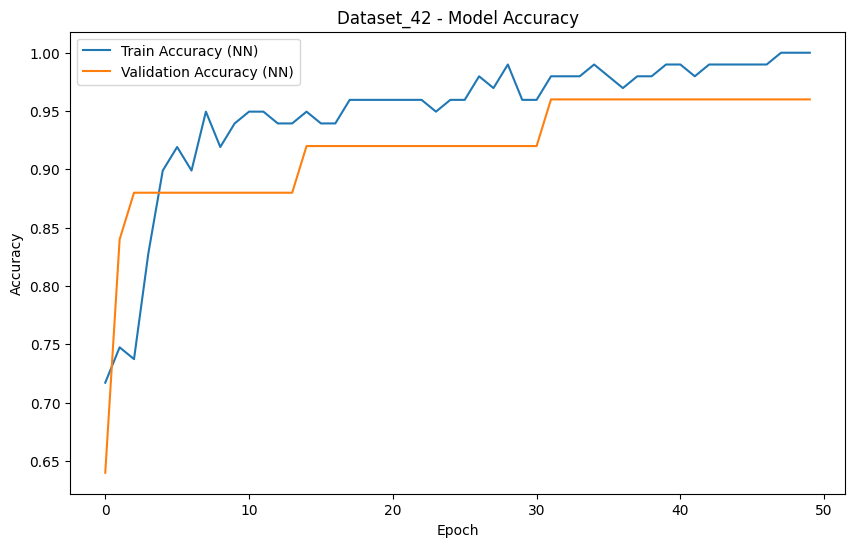

Processing Dataset_43...
Epoch 1/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6125 - loss: 0.6725 - val_accuracy: 0.7537 - val_loss: 0.6295
Epoch 2/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7150 - loss: 0.6305 - val_accuracy: 0.7685 - val_loss: 0.5922
Epoch 3/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7274 - loss: 0.5970 - val_accuracy: 0.7783 - val_loss: 0.5589
Epoch 4/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7413 - loss: 0.5722 - val_accuracy: 0.7783 - val_loss: 0.5328
Epoch 5/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7494 - loss: 0.5514 - val_accuracy: 0.7833 - val_loss: 0.5142
Epoch 6/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7394 - loss: 0.5454 - val_accuracy: 0.7734 - val_loss: 0.5062
Epoch 7/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7604 - loss: 0.5030 - val_accuracy: 0.7685 - val_loss: 0.5011
Epoch 8/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7213 - loss: 0.5499 - val_acc

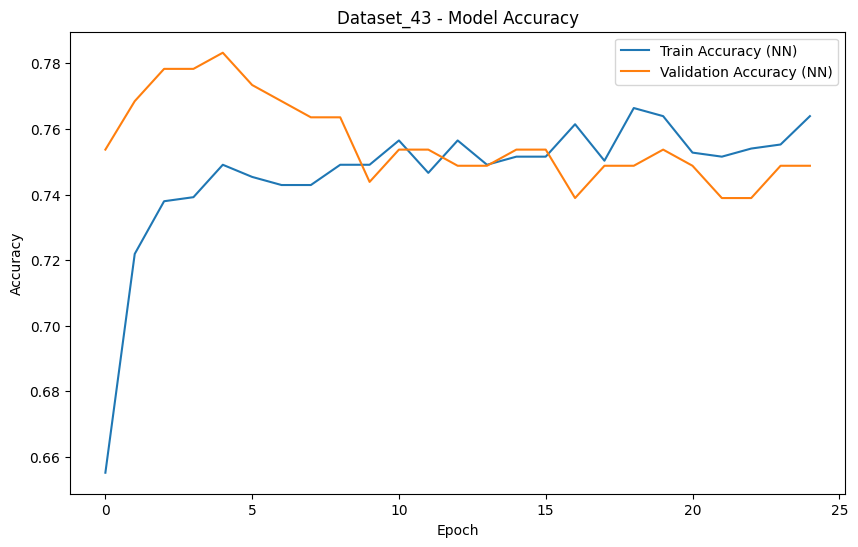

Processing Dataset_44...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.5705 - loss: 0.6785 - val_accuracy: 0.5556 - val_loss: 0.6540
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.5300 - loss: 0.6756 - val_accuracy: 0.6667 - val_loss: 0.6400
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.6351 - loss: 0.6683 - val_accuracy: 0.7778 - val_loss: 0.6266
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6998 - loss: 0.6440 - val_accuracy: 0.8889 - val_loss: 0.6135
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7298 - loss: 0.6462 - val_accuracy: 1.0000 - val_loss: 0.6000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.6651 - loss: 0.6368 - val_accuracy: 1.0000 - val_loss: 0.5868
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.8048 - loss: 0.6089 - val_accuracy: 1.0000 - val_loss: 0.5736
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8753 - loss: 0.6016 - val_accuracy: 1

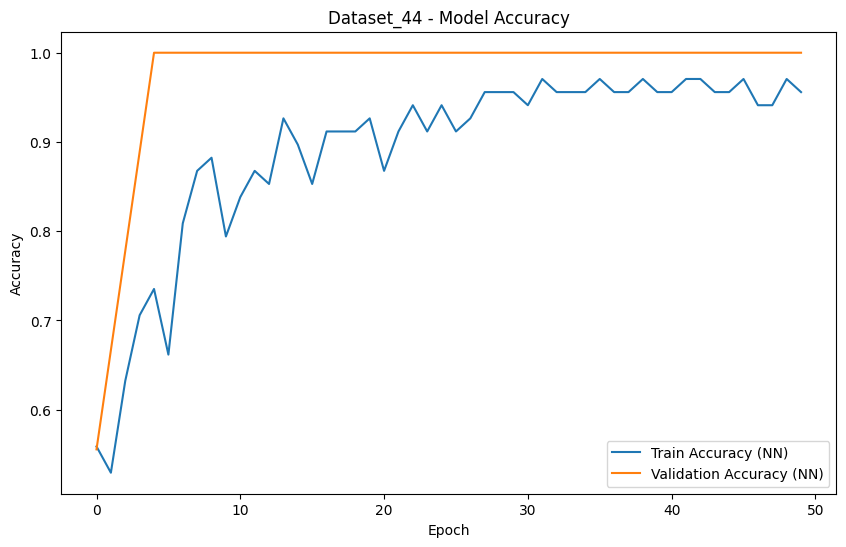

Processing Dataset_45...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.6559 - loss: 0.6809 - val_accuracy: 0.8983 - val_loss: 0.6458
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8333 - loss: 0.6522 - val_accuracy: 0.8983 - val_loss: 0.6191
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9085 - loss: 0.6257 - val_accuracy: 0.9153 - val_loss: 0.5932
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9411 - loss: 0.6048 - val_accuracy: 0.9322 - val_loss: 0.5674
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9412 - loss: 0.5754 - val_accuracy: 0.9322 - val_loss: 0.5396
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9388 - loss: 0.5479 - val_accuracy: 0.9322 - val_loss: 0.5105
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9595 - loss: 0.4948 - val_accuracy: 0.9322 - val_loss: 0.4796
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9623 - loss: 0.4697 - val_accuracy: 0.9322 -

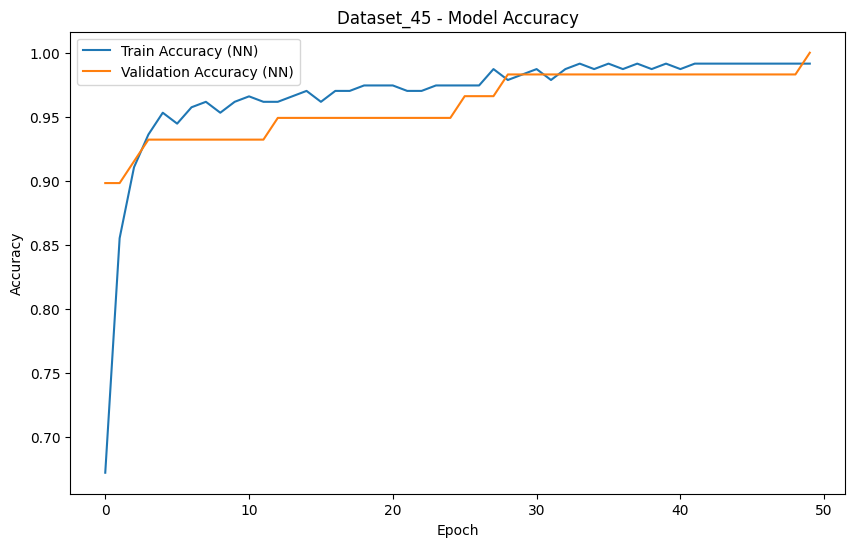

Processing Dataset_46...
Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.4654 - loss: 0.7057 - val_accuracy: 0.4651 - val_loss: 0.6714
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4975 - loss: 0.6749 - val_accuracy: 0.4884 - val_loss: 0.6443
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6429 - loss: 0.6402 - val_accuracy: 0.7907 - val_loss: 0.6185
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6829 - loss: 0.6423 - val_accuracy: 0.8140 - val_loss: 0.5952
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7278 - loss: 0.6133 - val_accuracy: 0.8605 - val_loss: 0.5737
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7922 - loss: 0.5947 - val_accuracy: 0.8605 - val_loss: 0.5533
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8449 - loss: 0.5671 - val_accuracy: 0.8837 - val_loss: 0.5337
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8234 - loss: 0.5580 - val_accuracy: 0.8837 -

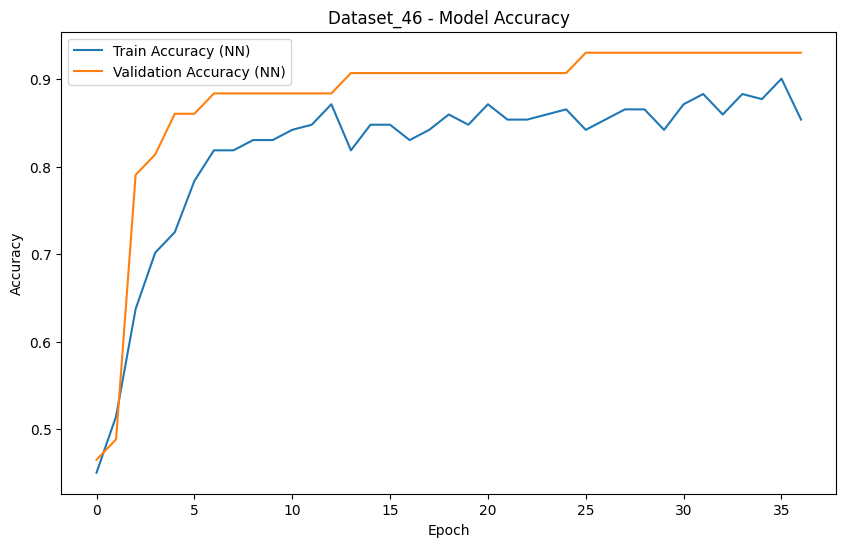

Processing Dataset_47...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.3874 - loss: 0.7343 - val_accuracy: 0.4167 - val_loss: 0.7086
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5369 - loss: 0.6585 - val_accuracy: 0.4167 - val_loss: 0.7026
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4702 - loss: 0.6948 - val_accuracy: 0.4167 - val_loss: 0.6955
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5473 - loss: 0.6710 - val_accuracy: 0.4167 - val_loss: 0.6892
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5303 - loss: 0.6579 - val_accuracy: 0.4167 - val_loss: 0.6831
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5828 - loss: 0.6507 - val_accuracy: 0.4583 - val_loss: 0.6774
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5090 - loss: 0.6649 - val_accuracy: 0.4583 - val_loss: 0.6711
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5653 - loss: 0.6527 - val_accuracy: 0

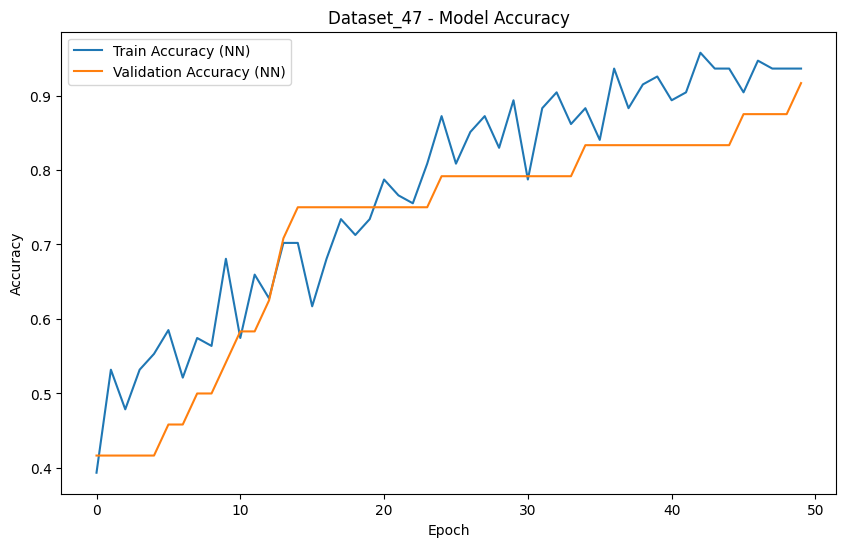

Processing Dataset_48...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.4611 - loss: 0.7653 - val_accuracy: 0.5500 - val_loss: 0.6983
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4845 - loss: 0.7136 - val_accuracy: 0.6833 - val_loss: 0.6742
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5760 - loss: 0.6852 - val_accuracy: 0.7667 - val_loss: 0.6524
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6338 - loss: 0.6465 - val_accuracy: 0.7333 - val_loss: 0.6314
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6824 - loss: 0.6346 - val_accuracy: 0.7667 - val_loss: 0.6095
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7501 - loss: 0.5879 - val_accuracy: 0.8167 - val_loss: 0.5852
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7809 - loss: 0.5785 - val_accuracy: 0.8000 - val_loss: 0.5610
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8442 - loss: 0.5333 - val_accuracy: 0.8000 -

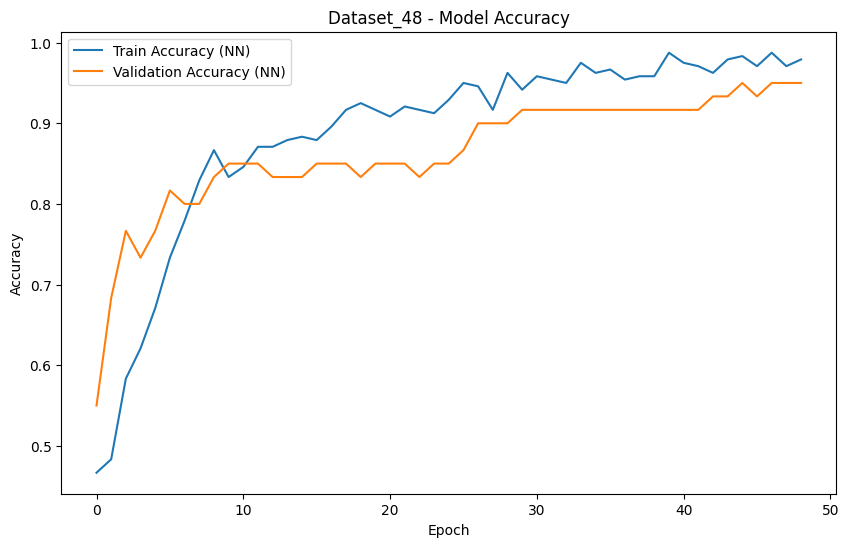

Processing Dataset_49...
Epoch 1/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5475 - loss: 0.6923 - val_accuracy: 0.9122 - val_loss: 0.5047
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8361 - loss: 0.5084 - val_accuracy: 0.9257 - val_loss: 0.3695
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8857 - loss: 0.4120 - val_accuracy: 0.9324 - val_loss: 0.2859
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9072 - loss: 0.3395 - val_accuracy: 0.9257 - val_loss: 0.2300
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8770 - loss: 0.2966 - val_accuracy: 0.9324 - val_loss: 0.1944
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8858 - loss: 0.2750 - val_accuracy: 0.9324 - val_loss: 0.1714
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9006 - loss: 0.2462 - val_accuracy: 0.9324 - val_loss: 0.1577
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9154 - loss: 0.2143 - val_acc

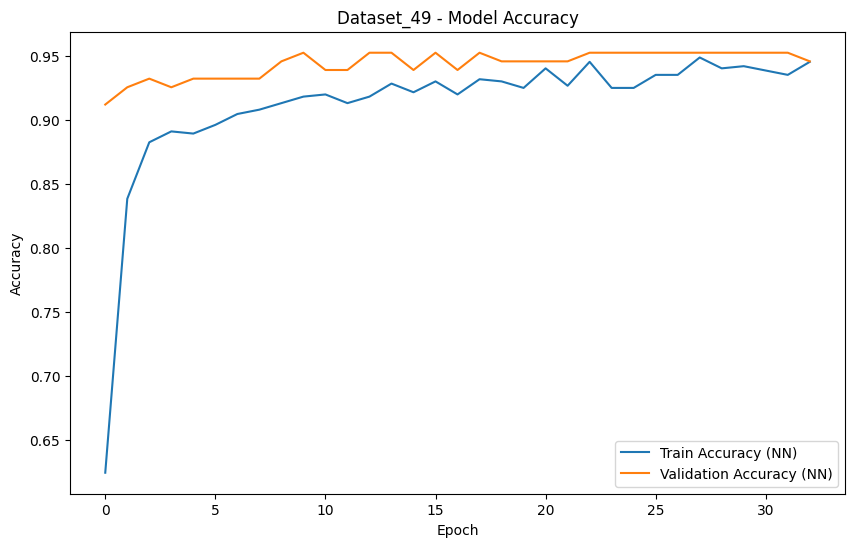

Processing Dataset_5...
Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.4614 - loss: 0.7076 - val_accuracy: 0.6721 - val_loss: 0.6340
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5582 - loss: 0.6536 - val_accuracy: 0.8525 - val_loss: 0.5752
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6773 - loss: 0.6139 - val_accuracy: 0.9344 - val_loss: 0.5255
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7579 - loss: 0.5712 - val_accuracy: 0.9344 - val_loss: 0.4749
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8511 - loss: 0.5289 - val_accuracy: 0.9508 - val_loss: 0.4248
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8439 - loss: 0.4697 - val_accuracy: 0.9508 - val_loss: 0.3766
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9120 - loss: 0.4341 - val_accuracy: 0.9590 - val_loss: 0.3294
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9214 - loss: 0.3892 - val_accuracy: 0.9590 - 

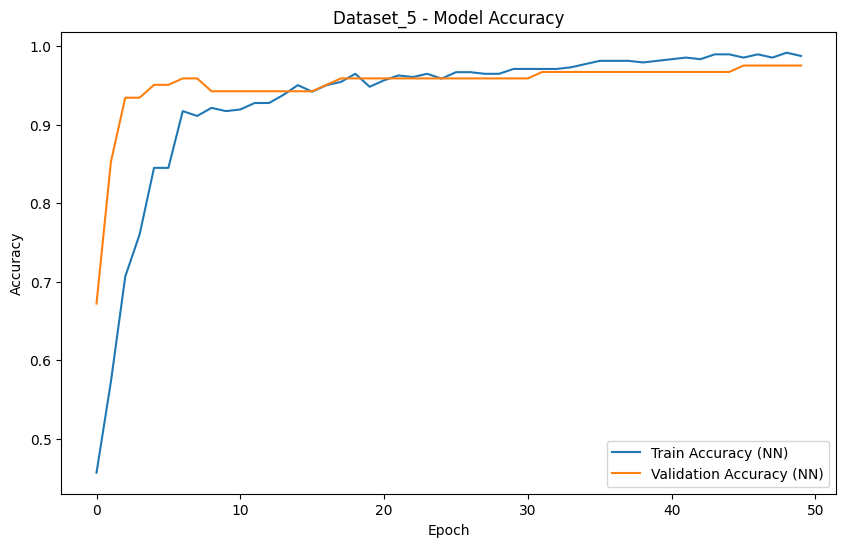

Processing Dataset_6...
Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.4929 - loss: 0.7172 - val_accuracy: 0.7632 - val_loss: 0.6114
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6598 - loss: 0.6330 - val_accuracy: 0.8421 - val_loss: 0.5620
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7572 - loss: 0.5829 - val_accuracy: 0.8947 - val_loss: 0.5154
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8048 - loss: 0.5436 - val_accuracy: 0.9211 - val_loss: 0.4708
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8526 - loss: 0.4953 - val_accuracy: 0.9211 - val_loss: 0.4276
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8838 - loss: 0.4399 - val_accuracy: 0.9342 - val_loss: 0.3862
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9019 - loss: 0.4148 - val_accuracy: 0.9342 - val_loss: 0.3466
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8921 - loss: 0.3758 - val_accuracy: 0.9342 - 

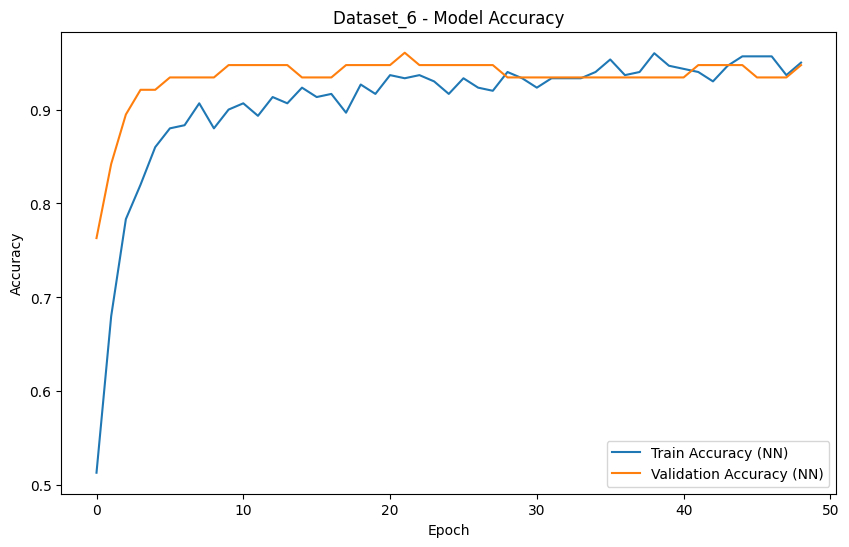

Processing Dataset_7...
Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5633 - loss: 0.6769 - val_accuracy: 0.8837 - val_loss: 0.5704
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8044 - loss: 0.5988 - val_accuracy: 0.9302 - val_loss: 0.4940
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8645 - loss: 0.5312 - val_accuracy: 0.9380 - val_loss: 0.4259
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8839 - loss: 0.4566 - val_accuracy: 0.9535 - val_loss: 0.3579
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9069 - loss: 0.4083 - val_accuracy: 0.9690 - val_loss: 0.2957
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9148 - loss: 0.3604 - val_accuracy: 0.9767 - val_loss: 0.2426
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9218 - loss: 0.3264 - val_accuracy: 0.9690 - val_loss: 0.2018
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9174 - loss: 0.2800 - val_accuracy: 0.9690 - v

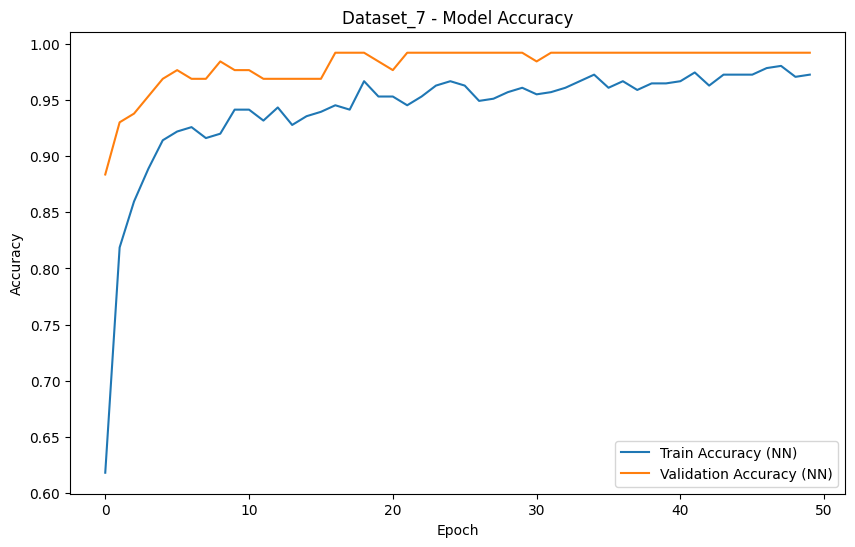

Processing Dataset_8...
Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.4807 - loss: 0.6939 - val_accuracy: 0.6939 - val_loss: 0.6645
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5379 - loss: 0.6815 - val_accuracy: 0.7551 - val_loss: 0.6523
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6320 - loss: 0.6689 - val_accuracy: 0.7755 - val_loss: 0.6400
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6221 - loss: 0.6672 - val_accuracy: 0.7755 - val_loss: 0.6292
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7318 - loss: 0.6496 - val_accuracy: 0.7551 - val_loss: 0.6185
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7193 - loss: 0.6384 - val_accuracy: 0.7755 - val_loss: 0.6074
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7692 - loss: 0.6406 - val_accuracy: 0.7755 - val_loss: 0.5961
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8124 - loss: 0.6094 - val_accuracy: 0.8571 - 

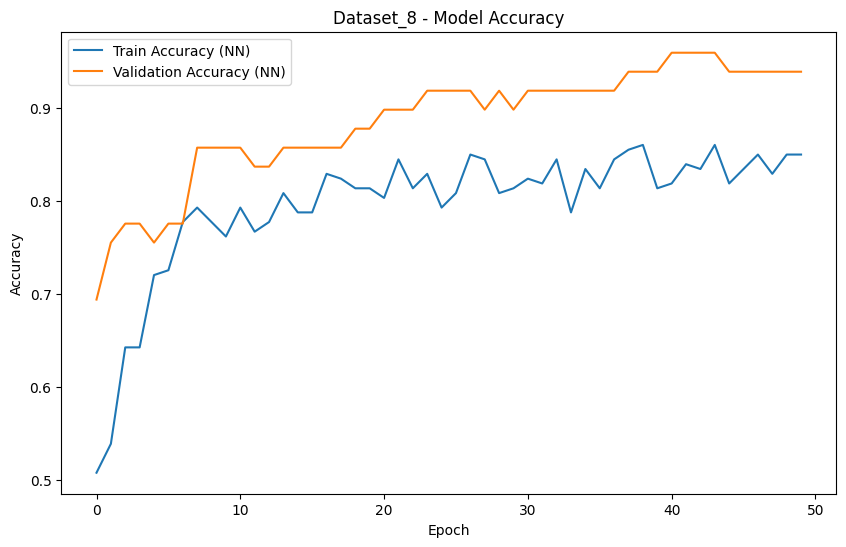

Processing Dataset_9...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.5000 - loss: 0.6925 - val_accuracy: 0.7333 - val_loss: 0.5955
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5448 - loss: 0.6515 - val_accuracy: 0.7333 - val_loss: 0.5635
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6382 - loss: 0.6262 - val_accuracy: 0.8333 - val_loss: 0.5361
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6651 - loss: 0.5906 - val_accuracy: 0.8333 - val_loss: 0.5124
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7580 - loss: 0.5714 - val_accuracy: 0.8333 - val_loss: 0.4943
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7845 - loss: 0.5578 - val_accuracy: 0.8333 - val_loss: 0.4798
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.8028 - loss: 0.5376 - val_accuracy: 0.8000 - val_loss: 0.4676
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.8236 - loss: 0.4966 - val_accuracy: 0.

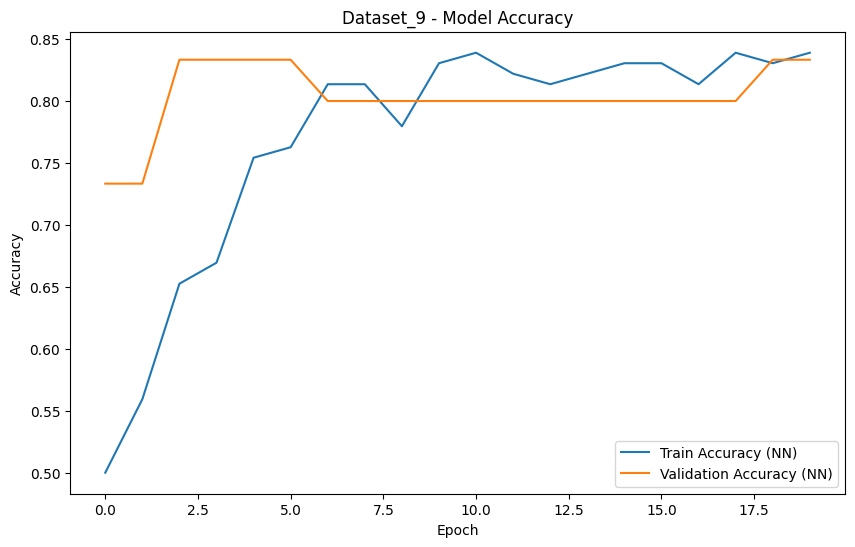

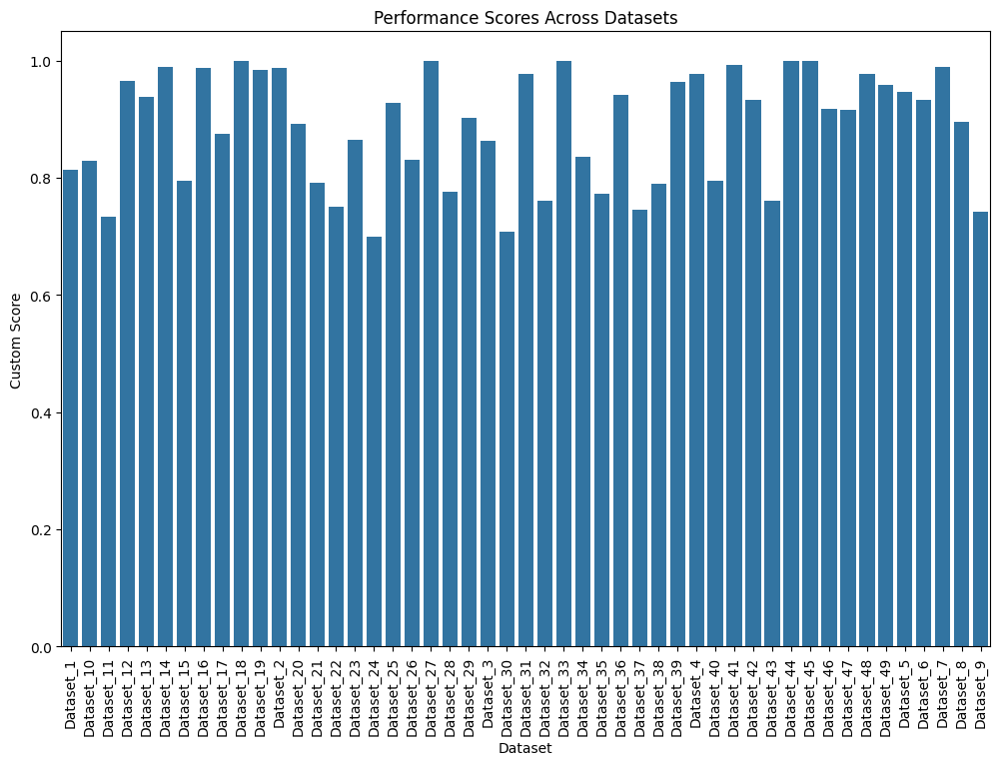

,Dataset,Accuracy,Precision,F1 Score,Score
0,Dataset_1,0.833333,0.782609,0.837209,0.814206
1,Dataset_10,0.827273,0.819672,0.840336,0.828152
2,Dataset_11,0.842105,0.625000,0.769231,0.733401
3,Dataset_12,0.977778,0.950000,0.974359,0.965641
4,Dataset_13,0.942308,0.928571,0.945455,0.937757
5,Dataset_14,0.980769,1.000000,0.981132,0.988570
6,Dataset_15,0.790000,0.808511,0.783505,0.795456
7,Dataset_16,0.991304,0.981481,0.990654,0.987180
8,Dataset_17,0.884615,0.857143,0.888889,0.874908
9,Dataset_18,1.000000,1.000000,1.000000,1.000000


In [3]:


# Function to load data from each dataset
def load_data(dataset_path):
    x_train = pd.read_csv(os.path.join(dataset_path, 'X_train.csv'))
    y_train = pd.read_csv(os.path.join(dataset_path, 'y_train.csv'))
    x_test = pd.read_csv(os.path.join(dataset_path, 'X_test.csv'))
    return x_train, y_train['target'], x_test

# Initialize lists to store results
scores = []
folders = sorted(os.listdir(main_dir))

for folder in folders:
    print(f"Processing {folder}...")
    dataset_path = os.path.join(main_dir, folder)
    
    # Load X_train, y_train, and X_test
    X_train, y_train, X_test = load_data(dataset_path)

    # Feature selection with SelectFromModel using Gradient Boosting
    selector = SelectFromModel(GradientBoostingClassifier(n_estimators=50, random_state=42), threshold='median')
    X_train = selector.fit_transform(X_train, y_train)
    X_test = selector.transform(X_test)

    # Handle class imbalance with SMOTE
    smote = SMOTE(random_state=42)
    X_train, y_train = smote.fit_resample(X_train, y_train)

    # Scaling features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Split the training data for validation
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

    # Train Neural Network independently
    model_nn = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    model_nn.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), loss='binary_crossentropy', metrics=['accuracy'])
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    history_nn = model_nn.fit(X_train, y_train, epochs=50, batch_size=64, validation_data=(X_val, y_val), verbose=1, callbacks=[early_stopping])

    # Train Gradient Boosting model independently
    model_gb = GradientBoostingClassifier(n_estimators=50, random_state=42)
    model_gb.fit(X_train, y_train)

    # Train Logistic Regression model independently
    model_lr = LogisticRegression(max_iter=1000, random_state=42)
    model_lr.fit(X_train, y_train)

    # Train Random Forest model independently
    model_rf = RandomForestClassifier(n_estimators=50, random_state=42)
    model_rf.fit(X_train, y_train)
    
    # Get validation predictions for each model
    y_val_pred_nn = (model_nn.predict(X_val) > 0.5).astype(int).flatten()
    y_val_pred_gb = model_gb.predict(X_val)
    y_val_pred_lr = model_lr.predict(X_val)
    y_val_pred_rf = model_rf.predict(X_val)

    # Ensemble by averaging predictions
    # y_val_pred_ensemble = (y_val_pred_nn + y_val_pred_gb + y_val_pred_lr >= 2).astype(int)
    y_val_pred_ensemble = (y_val_pred_nn + y_val_pred_gb + y_val_pred_lr + y_val_pred_rf >= 2).astype(int)

    # Evaluate the ensemble model
    accuracy = accuracy_score(y_val, y_val_pred_ensemble)
    precision = precision_score(y_val, y_val_pred_ensemble)
    f1 = f1_score(y_val, y_val_pred_ensemble)

    # Calculate custom score
    score = accuracy * 0.3 + precision * 0.4 + f1 * 0.3
    scores.append({'Dataset': folder, 'Accuracy': accuracy, 'Precision': precision, 'F1 Score': f1, 'Score': score})

    # Predict on the test set and save ensemble results
    y_test_pred_nn = (model_nn.predict(X_test) > 0.5).astype(int).flatten()
    y_test_pred_gb = model_gb.predict(X_test)
    y_test_pred_lr = model_lr.predict(X_test)
    y_test_pred_rf = model_rf.predict(X_test)
    # y_test_pred_ensemble = (y_test_pred_nn + y_test_pred_gb + y_test_pred_lr >= 2).astype(int)
    y_test_pred_ensemble = (y_test_pred_nn + y_test_pred_gb + y_test_pred_lr + y_test_pred_rf >= 2).astype(int)
    y_test_pred_df = pd.DataFrame(y_test_pred_ensemble, columns=['Prediction'])
    y_test_pred_df.to_csv(os.path.join(dataset_path, 'y_predict.csv'), index=False)

    # Plot metrics
    plt.figure(figsize=(10, 6))
    plt.plot(history_nn.history['accuracy'], label='Train Accuracy (NN)')
    plt.plot(history_nn.history['val_accuracy'], label='Validation Accuracy (NN)')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title(f'{folder} - Model Accuracy')
    plt.show()

# Display final scores for each dataset
scores_df = pd.DataFrame(scores)

# Visualization of the score performance across datasets
plt.figure(figsize=(12, 8))
sns.barplot(x='Dataset', y='Score', data=scores_df)
plt.xlabel('Dataset')
plt.ylabel('Custom Score')
plt.title('Performance Scores Across Datasets')
plt.xticks(rotation=90)
plt.show()

scores_df